To do List :
1. Import all dataset 
2. Funnel Analaysis (Do EDA ,Explore Lead activity and summarize being a funnel)
3. Explore Customer Segmentation
4. Analyze Contract 
5. Discount Impact analysis
6. Retention Analysis
7. Customer Engagement and intereaction
8. Best Promotion Portal ? Linkedin? Instagram ? Web?


# Export Library and Dataset

In [1]:
# Data manipulation and analysis
import pandas as pd
import numpy as np
from datetime import datetime
from datetime import timedelta
import re
import os

# Data visualization
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.express as px
import networkx as nx

# Math Formula 
from math import radians, cos, sin, asin, sqrt
from scipy.stats import f_oneway

# geocode
import reverse_geocode

# VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Machine learning and data preprocessing
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.feature_selection import chi2, f_regression, SelectKBest
from sklearn.model_selection import train_test_split
from sklearn.metrics import silhouette_score, mean_squared_error, mean_absolute_error, r2_score

# Machine learning models
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from skopt import BayesSearchCV
from sklearn.model_selection import GridSearchCV

# Configuration and display options
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.5f}'.format

# Apply a specific style for matplotlib plots
plt.style.use('ggplot')

import joblib

In [87]:
contracts = pd.read_csv('//Users/andi/Project/IEP SaaS Company Analaysis/Dataset/contracts.csv')
discount_types = pd.read_csv('//Users/andi/Project/IEP SaaS Company Analaysis/Dataset/discount_types.csv')
discounts = pd.read_csv('//Users/andi/Project/IEP SaaS Company Analaysis/Dataset/discounts.csv')
funnels = pd.read_csv('//Users/andi/Project/IEP SaaS Company Analaysis/Dataset/funnels.csv')
google_analytics = pd.read_csv('//Users/andi/Project/IEP SaaS Company Analaysis/Dataset/google_analytics.csv')
industries = pd.read_csv('//Users/andi/Project/IEP SaaS Company Analaysis/Dataset/industries.csv')
leads = pd.read_csv('//Users/andi/Project/IEP SaaS Company Analaysis/Dataset/leads.csv')
session_sources = pd.read_csv('//Users/andi/Project/IEP SaaS Company Analaysis/Dataset/session_sources.csv')
stages = pd.read_csv('//Users/andi/Project/IEP SaaS Company Analaysis/Dataset/stages.csv')
saas_additional_data = pd.read_excel('//Users/andi/Project/IEP SaaS Company Analaysis/Dataset/SaaS Additional Data.xlsx')
survey = pd.read_excel('//Users/andi/Project/IEP SaaS Company Analaysis/Dataset/Survey.xlsx')


In [3]:
# # Merging the datasets based on the provided ERD
# # Start with the leads table as the base
# merged_data = leads

# # Merging leads with contracts
# merged_data = merged_data.merge(contracts, on='leads_id', how='left')

# # Merging the result with discounts
# merged_data = merged_data.merge(discounts, on='contract_id', how='left')

# # Merging the result with discount_types
# merged_data = merged_data.merge(discount_types, on='discount_type_code', how='left')

# # Merging the result with funnels
# merged_data = merged_data.merge(funnels, on='leads_id', how='left')

# # Merging the result with stages
# merged_data = merged_data.merge(stages, on='stage_id', how='left')

# # Merging the result with google_analytics
# merged_data = merged_data.merge(google_analytics, on='leads_id', how='left')

# # Merging the result with industries
# merged_data = merged_data.merge(industries, on='industry_code', how='left')

# # Merging the result with session_sources
# merged_data = merged_data.merge(session_sources, on='session_source_code', how='left')


# # Display the merged data
# merged_data.head()


# Funnel Analysis

In [4]:
# Merge funnels with stages to get stage names
funnels_stages = funnels.merge(stages, on='stage_id')

# Merge funnels_with_stages with leads to get lead details
funnels_stages_leads = funnels_stages.merge(leads, on='leads_id')

# Display the first few rows of the merged data
funnels_stages_leads.head()


,funnel_id,leads_id,stage_id,TimeStamp,reason,stage,session_source_code,industry_code,leads_registered,number_of_employee
0,1,1,101,2020-11-25 13:49:44.000000 UTC,NaN,leads_registered,5,6,2020-11-25 13:49:44.000000 UTC,60
1,16,1,102,2020-12-02 10:07:04.000000 UTC,NaN,leads_qualification,5,6,2020-11-25 13:49:44.000000 UTC,60
2,36,1,103,2020-12-04 12:57:14.000000 UTC,NaN,initial_communication_success,5,6,2020-11-25 13:49:44.000000 UTC,60
3,61,1,104,2020-12-07 13:49:28.000000 UTC,not answered,approach_success,5,6,2020-11-25 13:49:44.000000 UTC,60
4,2,2,101,2020-11-26 09:04:53.000000 UTC,NaN,leads_registered,2,2,2020-11-26 09:04:53.000000 UTC,45


On reason column fill the NaN or Missing value with 'not answered'

In [5]:
# # Fill NaN values in 'reason' column with 'not answered'
# funnels_stages_leads['reason'].fillna('not answered', inplace=True)

# # Display the first few rows to confirm the changes
# funnels_stages_leads.head()



In [6]:
funnels_stages_leads['reason'].unique()

array([nan, 'not answered', 'not interested', 'price not fit',
       'not selected', 'already use other products'], dtype=object)

In [7]:
# Display unique values in the 'reason' column
unique_reasons = funnels_stages_leads['reason'].unique()
print(unique_reasons)


[nan 'not answered' 'not interested' 'price not fit' 'not selected'
 'already use other products']


In [8]:
# Count the unique values in the 'reason' column
reason_counts = funnels_stages_leads['reason'].value_counts()
print(reason_counts)


reason
not answered                  808
not interested                435
price not fit                 382
not selected                  285
already use other products     80
Name: count, dtype: int64


In [9]:
funnels_stages_leads.describe

<bound method NDFrame.describe of        funnel_id  leads_id  stage_id                       TimeStamp  \
0              1         1       101  2020-11-25 13:49:44.000000 UTC   
1             16         1       102  2020-12-02 10:07:04.000000 UTC   
2             36         1       103  2020-12-04 12:57:14.000000 UTC   
3             61         1       104  2020-12-07 13:49:28.000000 UTC   
4              2         2       101  2020-11-26 09:04:53.000000 UTC   
5             25         2       102  2020-12-03 13:07:29.000000 UTC   
6             29         2       103  2020-12-04 09:41:16.000000 UTC   
7             60         2       104  2020-12-07 12:32:29.000000 UTC   
8            154         2       105  2020-12-14 09:56:32.000000 UTC   
9            189         2       106  2020-12-15 16:43:05.000000 UTC   
10           324         2       107  2020-12-24 14:10:10.000000 UTC   
11           459         2       108  2021-01-01 17:45:51.000000 UTC   
12             3         3    

In [10]:
funnels_stages_leads.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16328 entries, 0 to 16327
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   funnel_id            16328 non-null  int64 
 1   leads_id             16328 non-null  int64 
 2   stage_id             16328 non-null  int64 
 3   TimeStamp            16328 non-null  object
 4   reason               1990 non-null   object
 5   stage                16328 non-null  object
 6   session_source_code  16328 non-null  int64 
 7   industry_code        16328 non-null  int64 
 8   leads_registered     16328 non-null  object
 9   number_of_employee   16328 non-null  int64 
dtypes: int64(6), object(4)
memory usage: 1.2+ MB


In [11]:
# Convert 'TimeStamp' and 'leads_registered' to datetime
funnels_stages_leads['TimeStamp'] = pd.to_datetime(funnels_stages_leads['TimeStamp'])
funnels_stages_leads['leads_registered'] = pd.to_datetime(funnels_stages_leads['leads_registered'])


# Display the first few rows to confirm changes
funnels_stages_leads.head()


,funnel_id,leads_id,stage_id,TimeStamp,reason,stage,session_source_code,industry_code,leads_registered,number_of_employee
0,1,1,101,2020-11-25 13:49:44+00:00,NaN,leads_registered,5,6,2020-11-25 13:49:44+00:00,60
1,16,1,102,2020-12-02 10:07:04+00:00,NaN,leads_qualification,5,6,2020-11-25 13:49:44+00:00,60
2,36,1,103,2020-12-04 12:57:14+00:00,NaN,initial_communication_success,5,6,2020-11-25 13:49:44+00:00,60
3,61,1,104,2020-12-07 13:49:28+00:00,not answered,approach_success,5,6,2020-11-25 13:49:44+00:00,60
4,2,2,101,2020-11-26 09:04:53+00:00,NaN,leads_registered,2,2,2020-11-26 09:04:53+00:00,45


In [12]:
funnels_stages_leads.describe

<bound method NDFrame.describe of        funnel_id  leads_id  stage_id                 TimeStamp  \
0              1         1       101 2020-11-25 13:49:44+00:00   
1             16         1       102 2020-12-02 10:07:04+00:00   
2             36         1       103 2020-12-04 12:57:14+00:00   
3             61         1       104 2020-12-07 13:49:28+00:00   
4              2         2       101 2020-11-26 09:04:53+00:00   
5             25         2       102 2020-12-03 13:07:29+00:00   
6             29         2       103 2020-12-04 09:41:16+00:00   
7             60         2       104 2020-12-07 12:32:29+00:00   
8            154         2       105 2020-12-14 09:56:32+00:00   
9            189         2       106 2020-12-15 16:43:05+00:00   
10           324         2       107 2020-12-24 14:10:10+00:00   
11           459         2       108 2021-01-01 17:45:51+00:00   
12             3         3       101 2020-11-26 09:26:32+00:00   
13            27         3       102 2020-

In [13]:
funnels_stages_leads.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16328 entries, 0 to 16327
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   funnel_id            16328 non-null  int64              
 1   leads_id             16328 non-null  int64              
 2   stage_id             16328 non-null  int64              
 3   TimeStamp            16328 non-null  datetime64[ns, UTC]
 4   reason               1990 non-null   object             
 5   stage                16328 non-null  object             
 6   session_source_code  16328 non-null  int64              
 7   industry_code        16328 non-null  int64              
 8   leads_registered     16328 non-null  datetime64[ns, UTC]
 9   number_of_employee   16328 non-null  int64              
dtypes: datetime64[ns, UTC](2), int64(6), object(2)
memory usage: 1.2+ MB


## Calculate the funnel analysis conversion rate

In [14]:
# Define the correct order of stages based on the business process
ordered_stages = [
    'leads_registered',
    'leads_qualification',
    'initial_communication_success',
    'approach_success',
    'discussion_success',
    'offer_sent',
    'quotation_recieved',
    'deal_won'
]

# Aggregate the number of leads at each stage
leads_per_stage = funnels_stages_leads.groupby('stage')['leads_id'].nunique().reset_index()
leads_per_stage.columns = ['stage', 'num_leads']

# Sort the leads_per_stage DataFrame based on the ordered stages
leads_per_stage['stage_order'] = leads_per_stage['stage'].apply(lambda x: ordered_stages.index(x))
leads_per_stage_sorted = leads_per_stage.sort_values(by='stage_order').reset_index(drop=True)

# Calculate the conversion rates from the initial stage "leads_registered" to each subsequent stage
total_leads_registered = leads_per_stage_sorted['num_leads'].iloc[0]
leads_per_stage_sorted['conversion_rate'] = (leads_per_stage_sorted['num_leads'] / total_leads_registered) * 100

# Calculate the drop-off rates between stages
leads_per_stage_sorted['drop_off_rate'] = leads_per_stage_sorted['num_leads'].diff(-1) / leads_per_stage_sorted['num_leads'] * 100

# Drop the helper column 'stage_order'
leads_per_stage_sorted = leads_per_stage_sorted.drop(columns=['stage_order'])

leads_per_stage_sorted


,stage,num_leads,conversion_rate,drop_off_rate
0,leads_registered,3397,100.00000,14.89550
1,leads_qualification,2891,85.10450,9.85818
2,initial_communication_success,2606,76.71475,14.35150
3,approach_success,2232,65.70503,19.13082
4,discussion_success,1805,53.13512,22.93629
5,offer_sent,1391,40.94790,20.56075
6,quotation_recieved,1105,32.52870,18.46154
7,deal_won,901,26.52340,NaN


In [15]:
# Prepare the data for Plotly
data_funnel = leads_per_stage_sorted.rename(columns={'num_leads': 'number', 'stage': 'stage'})

# Create the funnel plot using Plotly
fig = px.funnel(data_funnel, x='number', y='stage', title='Funnel Analysis')

# Define the file path
file_path = "/Users/andi/Project/IEP SaaS Company Analaysis/Images/funnel_analysis.png"

# Ensure the directory exists
os.makedirs(os.path.dirname(file_path), exist_ok=True)

# Save the image
fig.write_image(file_path)

# Show the plot
fig.show()


In [16]:
import plotly.express as px

# Prepare the data for Plotly
data_funnel = leads_per_stage_sorted.rename(columns={'num_leads': 'number', 'stage': 'stage'})
data_funnel['percentage'] = leads_per_stage_sorted['conversion_rate'].round(2).astype(str) + '%'

# Create the funnel plot with percentages using Plotly
fig = px.funnel(data_funnel, x='number', y='stage', title='Funnel Analysis')

# Add annotations for percentage conversion rates
for i, row in data_funnel.iterrows():
    fig.add_annotation(x=row['number'], y=row['stage'], text=row['percentage'], showarrow=False, font=dict(size=12))

# Define the file path
file_path = "/Users/andi/Project/IEP SaaS Company Analaysis/Images/funnel_analysis_with_percentage.png"

# Ensure the directory exists
os.makedirs(os.path.dirname(file_path), exist_ok=True)

# Save the image
fig.write_image(file_path)

fig.show()


1. Leads Registered:
    - Count: 3397
    - Cumulative Conversion Rate: 100%
    - Description: Initial stage where users visiting the company website fill out a form and become registered leads.


2. Leads Qualification:
    - Count: 2891
    - Drop-off Rate: 14.90%
    - Cumulative Conversion Rate: 85.10%
    - Description: This stage qualifies the registered leads based on specific criteria to determine if they are potential customers. This stage has the largest drop-off, indicating that a significant number of leads do not meet the qualification criteria or are not engaged enough to proceed.


3. Initial Communication Success:
    - Count: 2606
    - Drop-off Rate: 9.86%
    - Cumulative Conversion Rate: 76.71%
    - Description: Qualified leads are contacted to establish initial communication. This stage ensures that the leads are interested and available for further discussions.


4. Approach Success:
    - Count: 2232
    - Drop-off Rate: 14.35%
    - Cumulative Conversion Rate: 65.71%
    - Description: Leads are approached for further discussions. This stage involves scheduling and confirming discussions with the leads.


5. Discussion Success:
    - Count: 1805
    - Drop-off Rate: 19.13%
    - Cumulative Conversion Rate: 53.14%
    - Description: Leads are engaged in discussions about the product or service. The goal here is to explain the offering in detail and address any queries or concerns the leads might have.

6. Offer Sent:
    - Count: 1391
    - Drop-off Rate: 22.94%
    - Cumulative Conversion Rate: 40.95%    
    - Description: After successful discussions, a price offer is sent to the leads. This stage involves negotiating and presenting the pricing details to the potential customers.

7. Quotation Received:
    - Count: 1105
    - Drop-off Rate: 20.56%
    - Cumulative Conversion Rate: 32.53%
    - Description: Leads who accept the offer proceed to receive a formal quotation from the finance team. This stage involves the creation and delivery of a detailed quotation to the leads.

8. Deal Won:
    - Count: 901
    - Cumulative Conversion Rate: 26.52%        
    - Description: This is the final stage where the leads sign the contract and become customers. The deals are considered won once the contracts are finalized.

Insights:
    
    The stages with the highest drop-off rates are Discussion Success to Offer Sent (22.94%), Quotation Received (20.56%) and Approach Success to Discussion Success (19.13%).

    The overall conversion rate from Leads Registered to Deal Won is 26.52%.
    

## User Churn Reason Analysis 

In [17]:
# Aggregate the number of occurrences for each reason at each stage
drop_off_reasons = funnels_stages_leads.groupby(['stage', 'reason']).size().reset_index(name='count')

# Calculate the percentage of each reason for drop-offs within each stage
stage_totals = drop_off_reasons.groupby('stage')['count'].sum().reset_index()
drop_off_reasons = drop_off_reasons.merge(stage_totals, on='stage', suffixes=('', '_total'))
drop_off_reasons['percentage'] = (drop_off_reasons['count'] / drop_off_reasons['count_total']) * 100

# Display the results
print(drop_off_reasons)


                            stage                      reason  count  \
0                approach_success  already use other products     80   
1                approach_success                not answered    201   
2                approach_success              not interested    146   
3              discussion_success                not answered    109   
4              discussion_success              not interested    138   
5              discussion_success               price not fit    167   
6   initial_communication_success                not answered    286   
7   initial_communication_success              not interested     88   
8             leads_qualification                not selected    285   
9                      offer_sent                not answered    113   
10                     offer_sent              not interested     63   
11                     offer_sent               price not fit    110   
12             quotation_recieved                not answered   

In [18]:
# Filter the data for "leads_registered" stage
leads_qualification_reasons = funnels_stages_leads[funnels_stages_leads['stage'] == 'leads_registered']

# Aggregate the number of occurrences for each reason at the "leads_qualification" stage
leads_qualification_reasons_count = leads_qualification_reasons['reason'].value_counts().reset_index()
leads_qualification_reasons_count.columns = ['reason', 'count']

# Calculate the percentage of each reason for drop-offs at the "leads_qualification" stage
total_leads_qualification = leads_qualification_reasons_count['count'].sum()
leads_qualification_reasons_count['percentage'] = (leads_qualification_reasons_count['count'] / total_leads_qualification) * 100

# Display the results
print(leads_qualification_reasons_count)


Empty DataFrame
Columns: [reason, count, percentage]
Index: []


In [19]:
# Filter the data for "leads_qualification" stage
leads_qualification_reasons = funnels_stages_leads[funnels_stages_leads['stage'] == 'leads_qualification']

# Aggregate the number of occurrences for each reason at the "leads_qualification" stage
leads_qualification_reasons_count = leads_qualification_reasons['reason'].value_counts().reset_index()
leads_qualification_reasons_count.columns = ['reason', 'count']

# Calculate the percentage of each reason for drop-offs at the "leads_qualification" stage
total_leads_qualification = leads_qualification_reasons_count['count'].sum()
leads_qualification_reasons_count['percentage'] = (leads_qualification_reasons_count['count'] / total_leads_qualification) * 100

# Display the results
print(leads_qualification_reasons_count)


         reason  count  percentage
0  not selected    285   100.00000


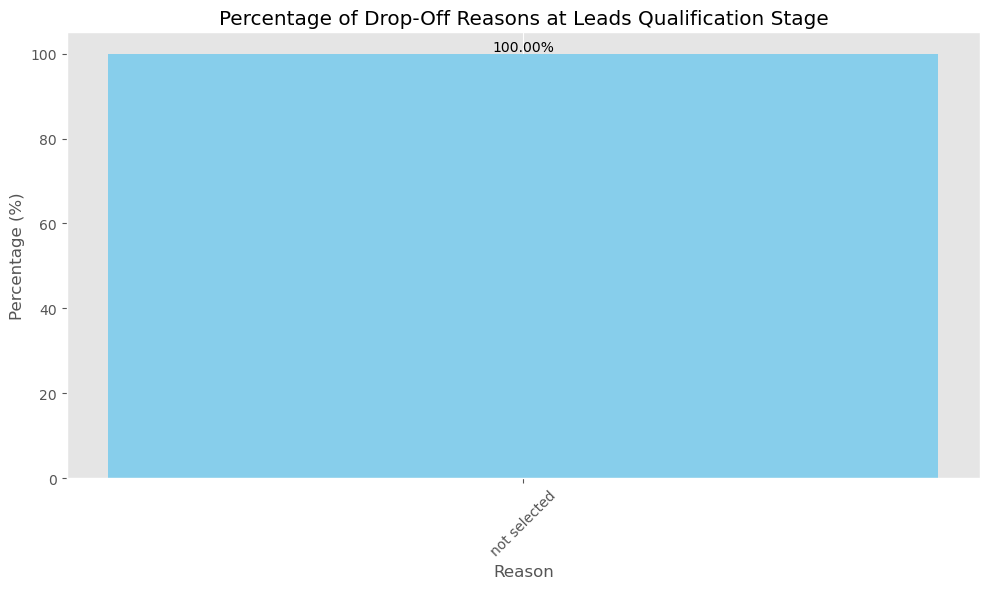

In [20]:
# Plotting the results with percentage labels
plt.figure(figsize=(10, 6))
bars = plt.bar(leads_qualification_reasons_count['reason'], leads_qualification_reasons_count['percentage'], color='skyblue')

# Adding percentage labels on top of the bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2.0, height, f'{height:.2f}%', ha='center', va='bottom')

plt.xlabel('Reason')
plt.ylabel('Percentage (%)')
plt.title('Percentage of Drop-Off Reasons at Leads Qualification Stage')
plt.xticks(rotation=45)
plt.grid(axis='y')


# Define the file path
file_path = "/Users/andi/Project/IEP SaaS Company Analaysis/Images/stage_2_reason_lead_qualification.png"

# Ensure the directory exists
os.makedirs(os.path.dirname(file_path), exist_ok=True)


# Save the image
plt.tight_layout()
plt.savefig(file_path, format='png')

# Display the plot
plt.show()



- Leads Qualification Stage
    - Drop-off Reason: Not selected
        - Percentage: 100%
    - Insight: Every lead that dropped off at this stage was not selected. This might indicate that the criteria for qualification are too stringent or not clearly defined, resulting in many leads being disqualified.

In [21]:
# Filter the data for "leads_qualification" stage
leads_qualification_reasons = funnels_stages_leads[funnels_stages_leads['stage'] == 'initial_communication_success']

# Aggregate the number of occurrences for each reason at the "leads_qualification" stage
leads_qualification_reasons_count = leads_qualification_reasons['reason'].value_counts().reset_index()
leads_qualification_reasons_count.columns = ['reason', 'count']

# Calculate the percentage of each reason for drop-offs at the "leads_qualification" stage
total_leads_qualification = leads_qualification_reasons_count['count'].sum()
leads_qualification_reasons_count['percentage'] = (leads_qualification_reasons_count['count'] / total_leads_qualification) * 100

# Display the results
print(leads_qualification_reasons_count)


           reason  count  percentage
0    not answered    286    76.47059
1  not interested     88    23.52941


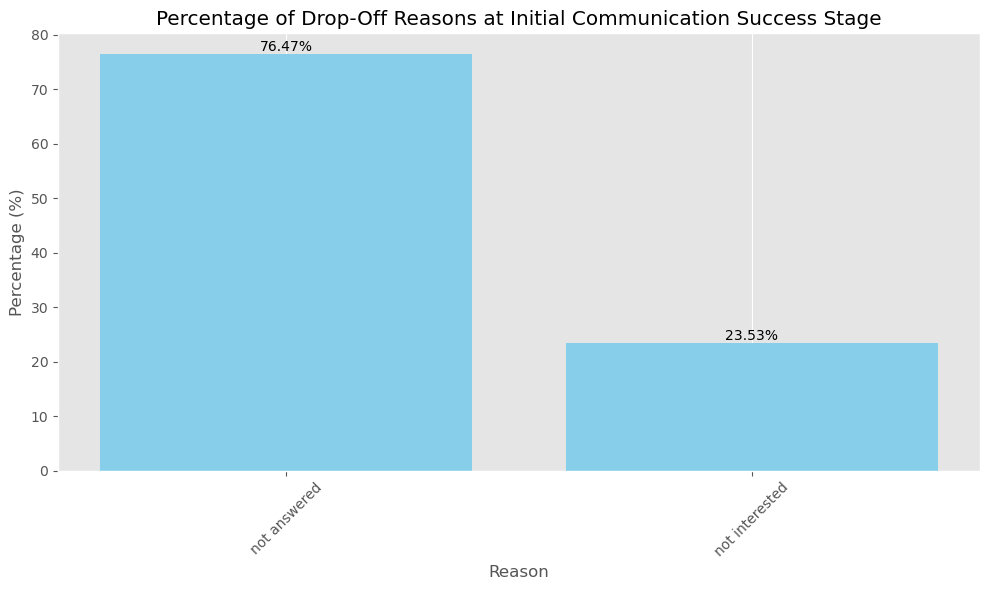

In [22]:
# Plotting the results with percentage labels
plt.figure(figsize=(10, 6))
bars = plt.bar(leads_qualification_reasons_count['reason'], leads_qualification_reasons_count['percentage'], color='skyblue')

# Adding percentage labels on top of the bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2.0, height, f'{height:.2f}%', ha='center', va='bottom')

plt.xlabel('Reason')
plt.ylabel('Percentage (%)')
plt.title('Percentage of Drop-Off Reasons at Initial Communication Success Stage')
plt.xticks(rotation=45)
plt.grid(axis='y')


# Define the file path
file_path = "/Users/andi/Project/IEP SaaS Company Analaysis/Images/stage_3_reason_initial_communication_success.png"

# Ensure the directory exists
os.makedirs(os.path.dirname(file_path), exist_ok=True)


# Save the image
plt.tight_layout()
plt.savefig(file_path, format='png')

# Display the plot
plt.show()



- Initial Communication Success Stage
    - Top Drop-off Reasons:
        - Not answered: 76.47%
        - Not interested: 23.53%
    - Insight: A large majority of leads are dropping off because they are not responding. This suggests a potential issue with the initial outreach method or timing. Additionally, a smaller portion is simply not interested, which could be due to the initial value proposition not resonating with them.

In [23]:
# Filter the data for "leads_qualification" stage
leads_qualification_reasons = funnels_stages_leads[funnels_stages_leads['stage'] == 'approach_success']

# Aggregate the number of occurrences for each reason at the "leads_qualification" stage
leads_qualification_reasons_count = leads_qualification_reasons['reason'].value_counts().reset_index()
leads_qualification_reasons_count.columns = ['reason', 'count']

# Calculate the percentage of each reason for drop-offs at the "leads_qualification" stage
total_leads_qualification = leads_qualification_reasons_count['count'].sum()
leads_qualification_reasons_count['percentage'] = (leads_qualification_reasons_count['count'] / total_leads_qualification) * 100

# Display the results
print(leads_qualification_reasons_count)


                       reason  count  percentage
0                not answered    201    47.07260
1              not interested    146    34.19204
2  already use other products     80    18.73536


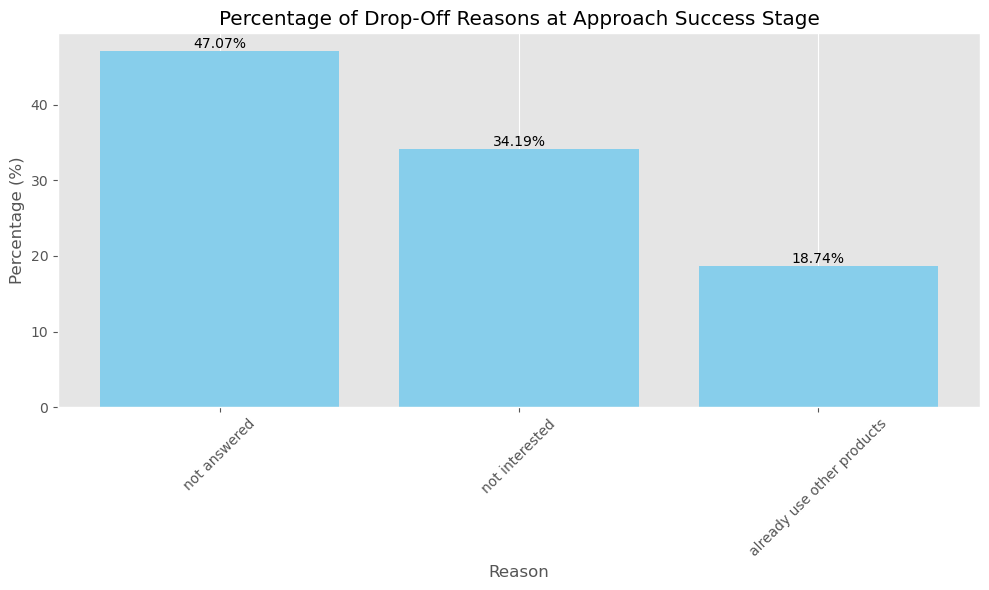

In [24]:
# Plotting the results with percentage labels
plt.figure(figsize=(10, 6))
bars = plt.bar(leads_qualification_reasons_count['reason'], leads_qualification_reasons_count['percentage'], color='skyblue')

# Adding percentage labels on top of the bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2.0, height, f'{height:.2f}%', ha='center', va='bottom')

plt.xlabel('Reason')
plt.ylabel('Percentage (%)')
plt.title('Percentage of Drop-Off Reasons at Approach Success Stage')
plt.xticks(rotation=45)
plt.grid(axis='y')


# Define the file path
file_path = "/Users/andi/Project/IEP SaaS Company Analaysis/Images/stage_4_reason_approach_success.png"

# Ensure the directory exists
os.makedirs(os.path.dirname(file_path), exist_ok=True)


# Save the image
plt.tight_layout()
plt.savefig(file_path, format='png')

# Display the plot
plt.show()



- Approach Success Stage
    - Top Drop-off Reasons:
        - Not answered: 47.07%
        - Not interested: 34.19%
        - Already use other products: 18.74%
    - Insight: Similar to the previous stage, a significant portion of leads are not responding. There is also a notable percentage of leads who are not interested or already use other products, indicating that the approach may need better targeting or differentiation from competitors.

In [25]:
# Filter the data for "leads_qualification" stage
leads_qualification_reasons = funnels_stages_leads[funnels_stages_leads['stage'] == 'discussion_success']

# Aggregate the number of occurrences for each reason at the "leads_qualification" stage
leads_qualification_reasons_count = leads_qualification_reasons['reason'].value_counts().reset_index()
leads_qualification_reasons_count.columns = ['reason', 'count']

# Calculate the percentage of each reason for drop-offs at the "leads_qualification" stage
total_leads_qualification = leads_qualification_reasons_count['count'].sum()
leads_qualification_reasons_count['percentage'] = (leads_qualification_reasons_count['count'] / total_leads_qualification) * 100

# Display the results
print(leads_qualification_reasons_count)


           reason  count  percentage
0   price not fit    167    40.33816
1  not interested    138    33.33333
2    not answered    109    26.32850


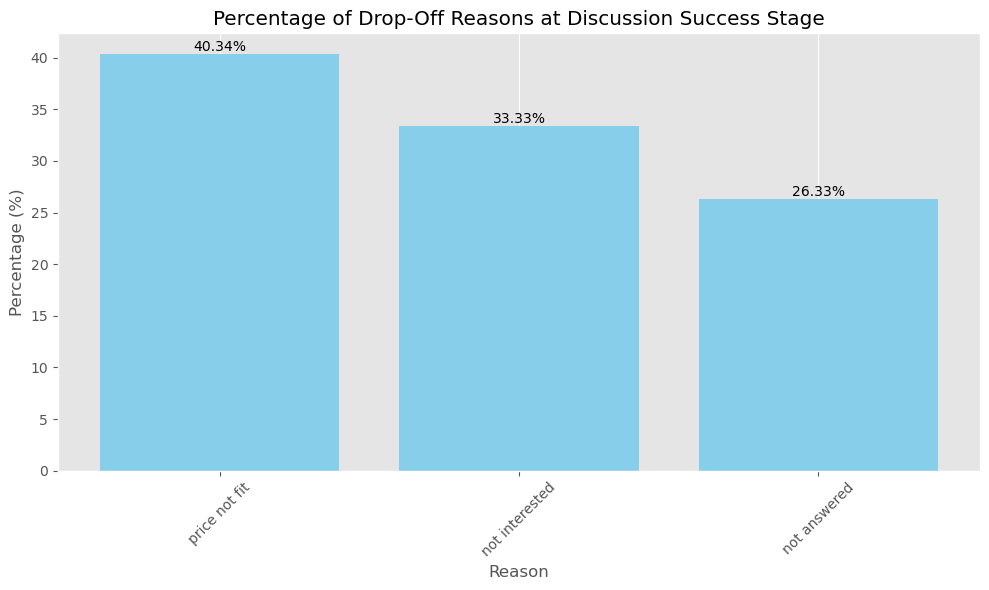

In [26]:
# Plotting the results with percentage labels
plt.figure(figsize=(10, 6))
bars = plt.bar(leads_qualification_reasons_count['reason'], leads_qualification_reasons_count['percentage'], color='skyblue')

# Adding percentage labels on top of the bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2.0, height, f'{height:.2f}%', ha='center', va='bottom')

plt.xlabel('Reason')
plt.ylabel('Percentage (%)')
plt.title('Percentage of Drop-Off Reasons at Discussion Success Stage')
plt.xticks(rotation=45)
plt.grid(axis='y')


# Define the file path
file_path = "/Users/andi/Project/IEP SaaS Company Analaysis/Images/stage_5_reason_discussion_success.png"

# Ensure the directory exists
os.makedirs(os.path.dirname(file_path), exist_ok=True)


# Save the image
plt.tight_layout()
plt.savefig(file_path, format='png')

# Display the plot
plt.show()



- Discussion Success Stage
    - Top Drop-off Reasons:
        - Price not fit: 40.34%
        - Not interested: 33.33%
        - Not answered: 26.33%
    - Insight: Pricing appears to be a major concern at this stage, with many leads dropping off because they find the price unsuitable. This might indicate a need to revisit the pricing strategy or offer more flexible pricing options. Additionally, some leads are not interested or not answering, which might point to issues in the discussion phase itself.


In [27]:
# Filter the data for "leads_qualification" stage
leads_qualification_reasons = funnels_stages_leads[funnels_stages_leads['stage'] == 'offer_sent']

# Aggregate the number of occurrences for each reason at the "leads_qualification" stage
leads_qualification_reasons_count = leads_qualification_reasons['reason'].value_counts().reset_index()
leads_qualification_reasons_count.columns = ['reason', 'count']

# Calculate the percentage of each reason for drop-offs at the "leads_qualification" stage
total_leads_qualification = leads_qualification_reasons_count['count'].sum()
leads_qualification_reasons_count['percentage'] = (leads_qualification_reasons_count['count'] / total_leads_qualification) * 100

# Display the results
print(leads_qualification_reasons_count)


           reason  count  percentage
0    not answered    113    39.51049
1   price not fit    110    38.46154
2  not interested     63    22.02797


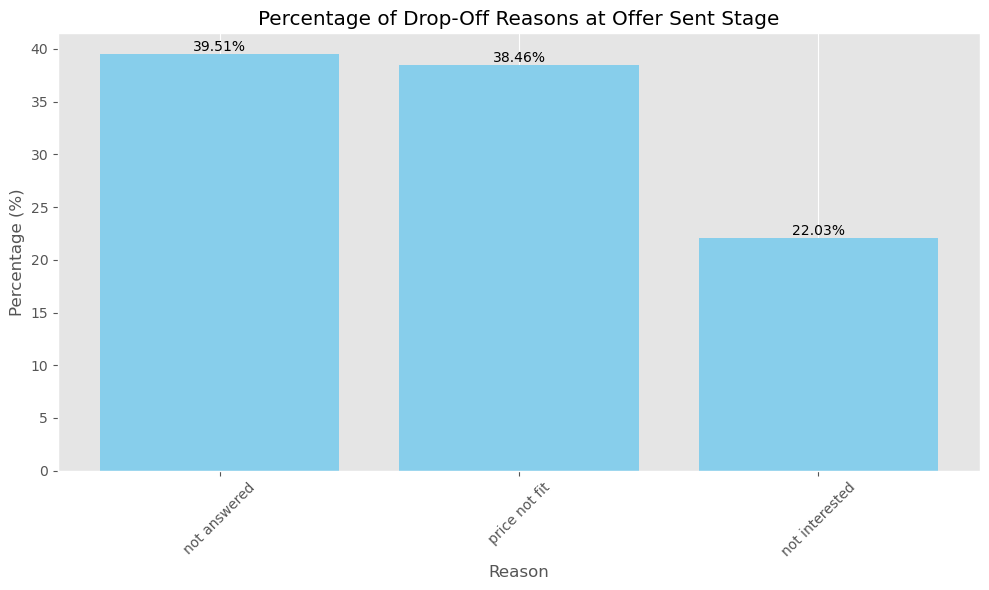

In [28]:
# Plotting the results with percentage labels
plt.figure(figsize=(10, 6))
bars = plt.bar(leads_qualification_reasons_count['reason'], leads_qualification_reasons_count['percentage'], color='skyblue')

# Adding percentage labels on top of the bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2.0, height, f'{height:.2f}%', ha='center', va='bottom')

plt.xlabel('Reason')
plt.ylabel('Percentage (%)')
plt.title('Percentage of Drop-Off Reasons at Offer Sent Stage')
plt.xticks(rotation=45)
plt.grid(axis='y')


# Define the file path
file_path = "/Users/andi/Project/IEP SaaS Company Analaysis/Images/stage_6_reason_offer_sent_success.png"

# Ensure the directory exists
os.makedirs(os.path.dirname(file_path), exist_ok=True)


# Save the image
plt.tight_layout()
plt.savefig(file_path, format='png')

# Display the plot
plt.show()



- Offer Sent Stage
    - Top Drop-off Reasons:
        - Not answered: 39.51%
        - Price not fit: 38.46%
        - Not interested: 22.03%
    - Insight: Similar to the discussion stage, the price is again a major factor causing drop-offs. Non-responsiveness and lack of interest also remain significant issues, suggesting that the offers being sent are either not compelling enough or not reaching the right audience.


In [29]:
# Filter the data for "leads_qualification" stage
leads_qualification_reasons = funnels_stages_leads[funnels_stages_leads['stage'] == 'quotation_recieved']

# Aggregate the number of occurrences for each reason at the "leads_qualification" stage
leads_qualification_reasons_count = leads_qualification_reasons['reason'].value_counts().reset_index()
leads_qualification_reasons_count.columns = ['reason', 'count']

# Calculate the percentage of each reason for drop-offs at the "leads_qualification" stage
total_leads_qualification = leads_qualification_reasons_count['count'].sum()
leads_qualification_reasons_count['percentage'] = (leads_qualification_reasons_count['count'] / total_leads_qualification) * 100

# Display the results
print(leads_qualification_reasons_count)


          reason  count  percentage
0  price not fit    105    51.47059
1   not answered     99    48.52941


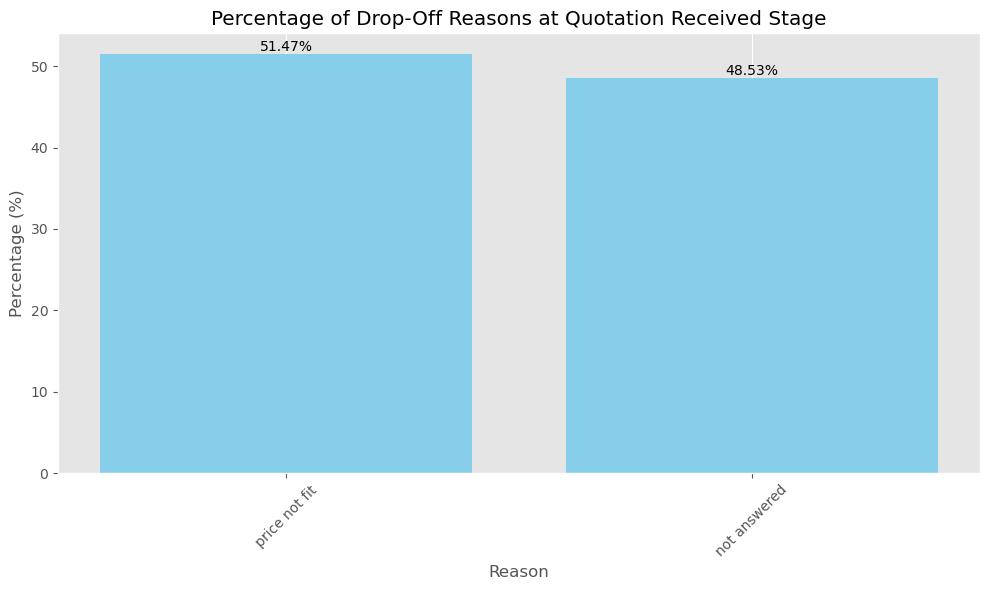

In [30]:
# Plotting the results with percentage labels
plt.figure(figsize=(10, 6))
bars = plt.bar(leads_qualification_reasons_count['reason'], leads_qualification_reasons_count['percentage'], color='skyblue')

# Adding percentage labels on top of the bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2.0, height, f'{height:.2f}%', ha='center', va='bottom')

plt.xlabel('Reason')
plt.ylabel('Percentage (%)')
plt.title('Percentage of Drop-Off Reasons at Quotation Received Stage')
plt.xticks(rotation=45)
plt.grid(axis='y')


# Define the file path
file_path = "/Users/andi/Project/IEP SaaS Company Analaysis/Images/stage_7_quotation_received.png"

# Ensure the directory exists
os.makedirs(os.path.dirname(file_path), exist_ok=True)


# Save the image
plt.tight_layout()
plt.savefig(file_path, format='png')

# Display the plot
plt.show()



- Quotation Received Stage
    - Top Drop-off Reasons:
        - Price not fit: 51.47%
        - Not answered: 48.53%
    - Insight: Pricing is the most significant issue at this stage, with more than half of the leads dropping off due to price concerns. Non-responsiveness is also a major problem, which could indicate that the follow-up after sending the quotation is not effective.

In [31]:
# Filter the data for "leads_qualification" stage
leads_qualification_reasons = funnels_stages_leads[funnels_stages_leads['stage'] == 'deal_won']

# Aggregate the number of occurrences for each reason at the "leads_qualification" stage
leads_qualification_reasons_count = leads_qualification_reasons['reason'].value_counts().reset_index()
leads_qualification_reasons_count.columns = ['reason', 'count']

# Calculate the percentage of each reason for drop-offs at the "leads_qualification" stage
total_leads_qualification = leads_qualification_reasons_count['count'].sum()
leads_qualification_reasons_count['percentage'] = (leads_qualification_reasons_count['count'] / total_leads_qualification) * 100

# Display the results
print(leads_qualification_reasons_count)


Empty DataFrame
Columns: [reason, count, percentage]
Index: []


Overall Insights :
1. Non-responsiveness: A common theme across multiple stages is leads not responding. This could be addressed by improving the follow-up process, changing the communication channels, or better timing of the outreach.
2. Pricing: Price is a significant factor in drop-offs at multiple stages. Consider revisiting the pricing strategy, offering more flexible pricing options, or better communicating the value proposition to justify the price.
3. Interest and Competition: Leads indicating a lack of interest or already using other products suggest a need for better targeting and differentiation from competitors.

# Customer Interaction and Engagement Analysis

In [32]:
# Analyze Google Analytics data for engagement metrics

# Calculate the average time spent on different website pages
page_engagement = google_analytics.groupby('Page_Name').agg({
    'Page_timestamp': 'count'
}).reset_index()
page_engagement.columns = ['Page Name', 'Number of Visits']

# Sort by the number of visits
page_engagement = page_engagement.sort_values(by='Number of Visits', ascending=False)


page_engagement


,Page Name,Number of Visits
0,/features,1650
6,/portofolio,1626
1,/form/brochure,1581
8,/testimonials,1467
4,/form/set-a-meeting,1381
7,/studycase,1364
2,/form/demo,1257
5,/home,1206
3,/form/publications,407


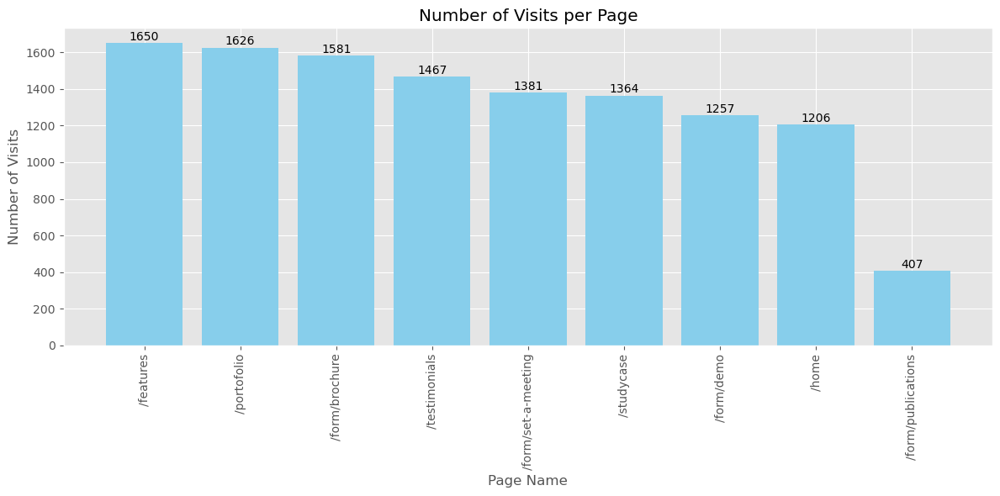

In [33]:
# Plotting the bar chart
plt.figure(figsize=(12, 6))
bars = plt.bar(page_engagement['Page Name'], page_engagement['Number of Visits'], color='skyblue')

# Adding numbers on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 1, int(yval), ha='center', va='bottom')

plt.xlabel('Page Name')
plt.ylabel('Number of Visits')
plt.title('Number of Visits per Page')
plt.xticks(rotation=90)
# Define the file path
file_path = "/Users/andi/Project/IEP SaaS Company Analaysis/Images/Number of Visits per Page.png"

# Ensure the directory exists
os.makedirs(os.path.dirname(file_path), exist_ok=True)


# Save the image
plt.tight_layout()
plt.savefig(file_path, format='png')

# Display the plot
plt.show()



In [34]:
# Calculate conversion rates from visitors to leads and leads to customers

# Total visitors (assumed as the total number of Google Analytics entries)
total_visitors = google_analytics['ga_id'].nunique()

# Total leads (from the leads table)
total_leads = leads['leads_id'].nunique()

# Total customers (deals won from the contracts table)
total_customers = contracts['leads_id'].nunique()

# Calculate conversion rates
visitors_to_leads_conversion_rate = (total_leads / total_visitors) 
leads_to_customers_conversion_rate = (total_customers / total_leads)

conversion_rates = pd.DataFrame({
    'Metric': ['Total Visitors', 'Total Leads', 'Total Customers', 'Visitors to Leads Conversion Rate', 'Leads to Customers Conversion Rate'],
    'Value': [total_visitors, total_leads, total_customers, visitors_to_leads_conversion_rate, leads_to_customers_conversion_rate]
})

conversion_rates


,Metric,Value
0,Total Visitors,11939.00000
1,Total Leads,3397.00000
2,Total Customers,901.00000
3,Visitors to Leads Conversion Rate,0.28453
4,Leads to Customers Conversion Rate,0.26523


## Website Engagement

In [35]:
# Analyze trends in website visits over time

# Convert page_timestamp to datetime
google_analytics['Page_timestamp'] = pd.to_datetime(google_analytics['Page_timestamp'])

# Extract month and year for aggregation
google_analytics['month_year'] = google_analytics['Page_timestamp'].dt.to_period('M')

# Aggregate number of visits per month
visits_trends = google_analytics.groupby('month_year').agg({'ga_id': 'count'}).reset_index()
visits_trends.columns = ['Month-Year', 'Number of Visits']

# Sort by Month-Year
visits_trends = visits_trends.sort_values('Month-Year')

# Identify the most popular pages and analyze trends in their visit patterns
popular_pages = google_analytics.groupby('Page_Name').agg({'ga_id': 'count'}).reset_index()
popular_pages.columns = ['Page Name', 'Number of Visits']
popular_pages = popular_pages.sort_values('Number of Visits', ascending=False)

# Get visit patterns for the top 5 most popular pages
top_5_pages = popular_pages.head(5)['Page Name'].tolist()
visit_patterns_top_pages = google_analytics[google_analytics['Page_Name'].isin(top_5_pages)]
visit_patterns_top_pages = visit_patterns_top_pages.groupby(['Page_Name', 'month_year']).agg({'ga_id': 'count'}).reset_index()
visit_patterns_top_pages.columns = ['Page Name', 'Month-Year', 'Number of Visits']
visit_patterns_top_pages = visit_patterns_top_pages.sort_values(['Page Name', 'Month-Year'])


visit_patterns_top_pages.head()


/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_4595/1615106547.py:7: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



,Page Name,Month-Year,Number of Visits
0,/features,2020-11,7
1,/features,2020-12,55
2,/features,2021-01,68
3,/features,2021-02,32
4,/features,2021-03,64


In [36]:
visits_trends

,Month-Year,Number of Visits
0,2020-11,38
1,2020-12,379
2,2021-01,381
3,2021-02,260
4,2021-03,440
5,2021-04,413
6,2021-05,333
7,2021-06,408
8,2021-07,375
9,2021-08,387


/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_4595/20990083.py:6: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



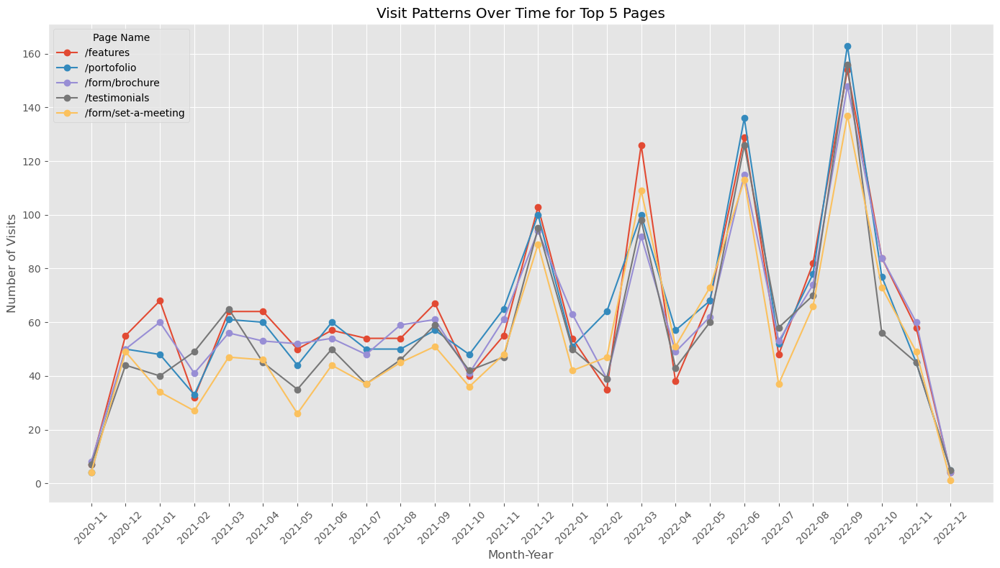

In [37]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have the 'google_analytics' DataFrame loaded and necessary transformations are done
google_analytics['Page_timestamp'] = pd.to_datetime(google_analytics['Page_timestamp'])
google_analytics['month_year'] = google_analytics['Page_timestamp'].dt.to_period('M')

# Aggregate number of visits per month
visits_trends = google_analytics.groupby('month_year').agg({'ga_id': 'count'}).reset_index()
visits_trends.columns = ['Month-Year', 'Number of Visits']
visits_trends = visits_trends.sort_values('Month-Year')

# Identify the most popular pages and analyze trends in their visit patterns
popular_pages = google_analytics.groupby('Page_Name').agg({'ga_id': 'count'}).reset_index()
popular_pages.columns = ['Page Name', 'Number of Visits']
popular_pages = popular_pages.sort_values('Number of Visits', ascending=False)

# Get visit patterns for the top 5 most popular pages
top_5_pages = popular_pages.head(5)['Page Name'].tolist()
visit_patterns_top_pages = google_analytics[google_analytics['Page_Name'].isin(top_5_pages)]
visit_patterns_top_pages = visit_patterns_top_pages.groupby(['Page_Name', 'month_year']).agg({'ga_id': 'count'}).reset_index()
visit_patterns_top_pages.columns = ['Page Name', 'Month-Year', 'Number of Visits']
visit_patterns_top_pages = visit_patterns_top_pages.sort_values(['Page Name', 'Month-Year'])

# Plotting the visit patterns for the top 5 pages
plt.figure(figsize=(14, 8))

for page in top_5_pages:
    page_data = visit_patterns_top_pages[visit_patterns_top_pages['Page Name'] == page]
    plt.plot(page_data['Month-Year'].astype(str), page_data['Number of Visits'], marker='o', label=page)

plt.xlabel('Month-Year')
plt.ylabel('Number of Visits')
plt.title('Visit Patterns Over Time for Top 5 Pages')
plt.xticks(rotation=45)
plt.legend(title='Page Name')

# Define the file path
file_path = "/Users/andi/Project/IEP SaaS Company Analaysis/Images/Visit Patterns Over Time For Top 5 Pages.png"

# Ensure the directory exists
os.makedirs(os.path.dirname(file_path), exist_ok=True)


# Save the image
plt.tight_layout()
plt.savefig(file_path, format='png')

# Display the plot
plt.show()


In [38]:
popular_pages

,Page Name,Number of Visits
0,/features,1650
6,/portofolio,1626
1,/form/brochure,1581
8,/testimonials,1467
4,/form/set-a-meeting,1381
7,/studycase,1364
2,/form/demo,1257
5,/home,1206
3,/form/publications,407


In [39]:
# Prepare data for user flow analysis by sorting the google_analytics dataframe by leads_id and timestamp
google_analytics_sorted = google_analytics.sort_values(by=['leads_id', 'Page_timestamp'])

# Shift the Page_Name column to get the next page visited by the same user
google_analytics_sorted['Next_Page'] = google_analytics_sorted.groupby('leads_id')['Page_Name'].shift(-1)

# Drop rows where Next_Page is NaN (i.e., the last page visited by a user)
google_analytics_sorted = google_analytics_sorted.dropna(subset=['Next_Page'])

# Count the transitions from one page to another
user_flow = google_analytics_sorted.groupby(['Page_Name', 'Next_Page']).size().reset_index(name='Count')


user_flow.head(100)


,Page_Name,Next_Page,Count
0,/features,/form/brochure,318
1,/features,/form/demo,246
2,/features,/form/publications,65
3,/features,/form/set-a-meeting,194
4,/features,/home,52
5,/features,/portofolio,198
6,/features,/studycase,282
7,/features,/testimonials,295
8,/form/brochure,/features,28
9,/form/brochure,/form/brochure,58


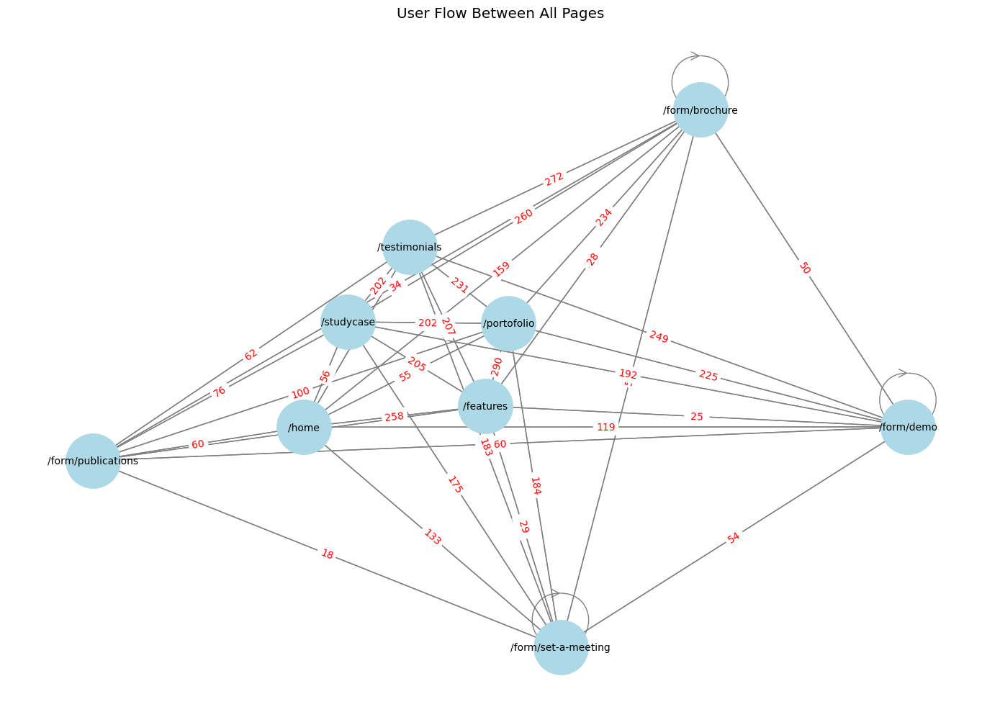

In [40]:
# Create a directed graph
G = nx.DiGraph()

# Add edges to the graph
for _, row in user_flow.iterrows():
    G.add_edge(row['Page_Name'], row['Next_Page'], weight=row['Count'])

# Plot the graph
plt.figure(figsize=(14, 10))
pos = nx.spring_layout(G, k=0.5)  # positions for all nodes

# Draw the nodes
nx.draw_networkx_nodes(G, pos, node_size=3000, node_color='lightblue')

# Draw the edges
edges = nx.draw_networkx_edges(G, pos, arrowstyle='->', arrowsize=20, edge_color='gray')

# Draw the labels
nx.draw_networkx_labels(G, pos, font_size=10, font_color='black')

# Draw the edge labels
edge_labels = {(row['Page_Name'], row['Next_Page']): row['Count'] for _, row in user_flow.iterrows()}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red')

plt.title('User Flow Between All Pages')
plt.axis('off')
# Define the file path
file_path = "/Users/andi/Project/IEP SaaS Company Analaysis/Images/User flow between all pages.png"

# Ensure the directory exists
os.makedirs(os.path.dirname(file_path), exist_ok=True)


# Save the image
plt.tight_layout()
plt.savefig(file_path, format='png')

# Display the plot
plt.show()

This directed graph illustrates the user flow between all pages on a website. Each node represents a webpage, and the directed edges (arrows) represent the transitions from one page to another. The edges are labeled with the count of transitions, which provides insight into the frequency of movement between pages. Here are some key observations:

1. High Transition Counts:

    - The transition from /form/brochure to /features has a high count of 272, indicating significant user navigation between these two pages.
    - The transition from /features to /portofolio has a count of 290, suggesting it's a common path for users.
    - Other high-count transitions include /portofolio to /features (184) and /features to /testimonials (207).

2. Central Pages:

    - Pages like /features, /testimonials, and /portofolio have multiple incoming and outgoing transitions, indicating they are central in the user journey.

3. Bidirectional Transitions:

    - Many pairs of pages have significant bidirectional traffic. For example, there is a considerable flow between /portofolio and /features in both directions.
    - Other notable bidirectional transitions include those between /features and /testimonials, /portofolio and /features, and /form/brochure and /features.

4. Less Frequent Transitions:

    - Some transitions have lower counts, such as /form/demo to /testimonials (18) and /form/set-a-meeting to /testimonials (29).

5. Pathways to Specific Pages:

    - Pages like /form/demo and /form/set-a-meeting have several transitions leading to them, suggesting they are end points or goals for many user journeys.

6. Popular Pathways:

    - Users frequently navigate between main sections like /features, /testimonials, and /portofolio, indicating these sections are of high interest.

In [41]:
# Calculate Bounce Rate
# Identify leads with only one page view
single_page_leads = google_analytics.groupby('leads_id').size().reset_index(name='Page_Views')
bounce_leads = single_page_leads[single_page_leads['Page_Views'] == 1]

# Calculate Bounce Rate
total_leads = google_analytics['leads_id'].nunique()
bounce_rate = len(bounce_leads) / total_leads * 100

# Calculate Cart Abandonment Rate
# Identify leads that visited `/form/set-a-meeting` or `/form/demo`
cart_leads = google_analytics[google_analytics['Page_Name'].isin(['/form/set-a-meeting', '/form/demo'])]['leads_id'].unique()

# Check if these leads reached the `deal_won` stage
deals_won_leads = funnels_stages_leads[funnels_stages_leads['stage'] == 'deal_won']['leads_id'].unique()
cart_abandonment_leads = [lead for lead in cart_leads if lead not in deals_won_leads]

# Calculate Cart Abandonment Rate
cart_abandonment_rate = len(cart_abandonment_leads) / len(cart_leads) * 100

# Calculate Average Session Duration
# Convert Page_timestamp to datetime
google_analytics['Page_timestamp'] = pd.to_datetime(google_analytics['Page_timestamp'])

# Calculate session duration for each lead
session_durations = google_analytics.groupby('leads_id')['Page_timestamp'].agg(['min', 'max'])
session_durations['session_duration'] = (session_durations['max'] - session_durations['min']).dt.total_seconds()

# Calculate Average Session Duration
average_session_duration = session_durations['session_duration'].mean() / 60  # in minutes

bounce_rate


14.601118634088902

In [42]:
cart_abandonment_rate

72.37544483985765

In [43]:
average_session_duration

1.2171082327543912

Key Metrics:
Bounce Rate: 14.60%

Definition: The percentage of visitors who navigate away from the site after viewing only one page.
Insight: A bounce rate of 14.60% is relatively low, indicating that the majority of visitors engage with more than one page on the website.
Cart Abandonment Rate: 72.37%

Definition: The percentage of users who add items to their cart but do not complete the purchase.
Insight: A high cart abandonment rate of 72.37% suggests that while users are interested in the products/services, there are potential barriers preventing them from completing the purchase. These could be due to pricing, user experience, or lack of trust.
Average Session Time: 1.22 minutes

Definition: The average duration of a user's session on the website.
Insight: An average session time of 1.22 minutes indicates that users spend a moderate amount of time on the site, which might be enough to browse through key pages but may not be sufficient for in-depth engagement or transactions.
Integrating Metrics into Customer Journey and Engagement Analysis:
Funnel Stage Analysis:
Awareness Stage (Bounce Rate):

The low bounce rate indicates effective initial engagement. Most users are motivated to explore beyond the landing page.
Action: Maintain or improve the quality of landing pages and initial content to keep the bounce rate low.
Consideration Stage (Average Session Time):

With an average session time of 1.22 minutes, users are likely exploring key pages but may not be engaging deeply.
Action: Enhance the content and usability of key pages to encourage longer sessions. Consider adding interactive elements or compelling calls to action to retain users longer.
Decision Stage (Cart Abandonment Rate):

The high cart abandonment rate is a critical issue in the decision stage, indicating a significant drop-off before conversion.
Action: Analyze the checkout process for friction points. Simplify the checkout process, provide clear pricing, and build trust with user reviews and testimonials. Consider implementing retargeting campaigns to recover abandoned carts.
Seasonality Insights:
March, June, September, December:
The visit patterns in these months suggest seasonality in user engagement. Use these periods to run targeted marketing campaigns, special promotions, and content updates to leverage the increased user activity.
Recommendations:
Enhance User Engagement:

Improve the content and interactivity on key pages to increase average session time.
Regularly update the website with fresh content, especially around seasonal peaks.
Reduce Cart Abandonment:

Streamline the checkout process and address any potential pain points.
Use retargeting emails and offers to encourage users to complete their purchases.
Leverage Seasonal Trends:

Plan marketing activities around identified peak months (March, June, September, December) to maximize engagement and conversions.
Monitor and Optimize:

Continuously monitor these metrics and conduct A/B testing to optimize user experience and engagement strategies.

## Lead Registration Overtime 

In [44]:
funnels_stages_1 = funnels.merge(stages, on='stage_id')

In [45]:
# Analyze trends in lead registrations over time

# Convert leads_registered to datetime
leads['leads_registered'] = pd.to_datetime(leads['leads_registered'], errors='coerce')

# Extract month and year for aggregation
leads['month_year'] = leads['leads_registered'].dt.to_period('M')

# Aggregate number of lead registrations per month
lead_registrations_trends = leads.groupby('month_year').agg({'leads_id': 'count'}).reset_index()
lead_registrations_trends.columns = ['Month-Year', 'Number of Lead Registrations']

# Sort by Month-Year
lead_registrations_trends = lead_registrations_trends.sort_values('Month-Year')


# Analyze funnel engagement to identify which stages have the most engagement and where drop-offs occur

lead_registrations_trends


/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_4595/2108445506.py:7: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



,Month-Year,Number of Lead Registrations
0,2020-11,10
1,2020-12,111
2,2021-01,108
3,2021-02,79
4,2021-03,122
5,2021-04,120
6,2021-05,95
7,2021-06,121
8,2021-07,106
9,2021-08,115


# Segmentation Analaysis 

## Segmentation By Company Size

In [46]:
    # Segment leads based on company size (number of employees)
company_size_segmentation = leads.groupby('number_of_employee').agg(
    total_leads=('leads_id', 'nunique')
).reset_index()

# Merge with the funnels to get the count of 'deal_won' for each company size
leads_deals_size = pd.merge(leads, funnels_stages, on='leads_id', how='left')
size_deals = leads_deals_size[leads_deals_size['stage'] == 'deal_won'].groupby('number_of_employee').agg(
    deals_won=('leads_id', 'nunique')
).reset_index()

# Combine both datasets
company_size_segmentation = pd.merge(company_size_segmentation, size_deals, on='number_of_employee', how='left')
company_size_segmentation['deals_won'] = company_size_segmentation['deals_won'].fillna(0)

# Calculate conversion rates
company_size_segmentation['conversion_rate'] = (company_size_segmentation['deals_won'] / company_size_segmentation['total_leads']) * 100

company_size_segmentation


,number_of_employee,total_leads,deals_won,conversion_rate
0,5,136,23,16.91176
1,10,123,28,22.76423
2,15,130,21,16.15385
3,20,124,33,26.61290
4,25,122,30,24.59016
5,30,123,28,22.76423
6,35,144,37,25.69444
7,40,112,18,16.07143
8,45,126,29,23.01587
9,50,197,48,24.36548


let's segments our customer by company size 
Micro :  < 10 employee
Small : 10 - 49 employee
Medium : 50 - 249 
Big : >=250

In [47]:
# Define company size segments
def company_size_segment(number_of_employee):
    if number_of_employee < 10:
        return 'Micro'
    elif 10 <= number_of_employee < 50:
        return 'Small'
    elif 50 <= number_of_employee < 250:
        return 'Medium'
    else:
        return 'Big'

# Apply the segmentation function
leads['company_size'] = leads['number_of_employee'].apply(company_size_segment)

# Segment leads based on company size
company_size_segmentation = leads.groupby('company_size').agg(
    total_leads=('leads_id', 'nunique')
).reset_index()

# Merge with the funnels to get the count of 'deal_won' for each company size
leads_deals_size = pd.merge(leads, funnels_stages, on='leads_id', how='left')
size_deals = leads_deals_size[leads_deals_size['stage'] == 'deal_won'].groupby('company_size').agg(
    deals_won=('leads_id', 'nunique')
).reset_index()

# Combine both datasets
company_size_segmentation = pd.merge(company_size_segmentation, size_deals, on='company_size', how='left')
company_size_segmentation['deals_won'] = company_size_segmentation['deals_won'].fillna(0)

# Calculate conversion rates
company_size_segmentation['conversion_rate'] = (company_size_segmentation['deals_won'] / company_size_segmentation['total_leads']) * 100

company_size_segmentation


,company_size,total_leads,deals_won,conversion_rate
0,Big,522,165,31.60920
1,Medium,1735,489,28.18444
2,Micro,136,23,16.91176
3,Small,1004,224,22.31076


Company Size Segmentation Analysis:
1. Big Companies (>= 250 employees)
    - Total Leads: 522
    - Deals Won: 165
    - Conversion Rate: 31.61%
    - Insight: Big companies have the highest conversion rate at 31.61%. This suggests that larger companies are more likely to convert into deals. The higher conversion rate might be due to larger budgets, more significant needs for the product/service, or more established procurement processes.

2. Medium Companies (50 - 249 employees)

    - Total Leads: 1735
    - Deals Won: 489
    - Conversion Rate: 28.18%
    - Insight: Medium-sized companies have a conversion rate of 28.18%, which is also relatively high. This segment represents a substantial portion of the leads and deals, indicating a strong market fit. Efforts to tailor the sales process to meet the needs of these companies could yield substantial results.

3. Small Companies (10 - 49 employees)

    - Total Leads: 1004
    - Deals Won: 224
    - Conversion Rate: 22.31%
    - Insight: Small companies have a conversion rate of 22.31%. While this is lower than the rates for big and medium-sized companies, it is still a significant portion of the market. Targeted marketing and sales strategies could help improve the conversion rate in this segment.

4. Micro Companies (< 10 employees)

    - Total Leads: 136
    - Deals Won: 23
    - Conversion Rate: 16.91%
    - Insight: Micro companies have the lowest conversion rate at 16.91%. This lower rate might be due to limited budgets or lesser needs for the product/service. It may be worth assessing the cost-effectiveness of targeting this segment or developing specialized offerings that cater specifically to the needs and constraints of micro companies.


Overall Insights:
- Focus on Large and Medium Companies: Given their higher conversion rates, focusing sales and marketing efforts on large and medium-sized companies could be more effective. These companies likely have more resources and greater demand for your product/service.
- Improvement for Small Companies: Small companies, while having a lower conversion rate than larger companies, still present a significant opportunity. Enhancing value propositions, offering tailored solutions, and providing more flexible pricing or payment options could help boost conversions in this segment.
- Specialized Approach for Micro Companies: With the lowest conversion rate, micro companies might need a different approach. Consider offering entry-level packages, cost-effective solutions, or educational content to help these smaller businesses see the value and fit of your product/service.

## Segmentation By Company Industry

In [48]:
# Merge leads with industries to get the industry names
leads_industries = pd.merge(leads, industries, on='industry_code', how='left')

# Group by industry and calculate the number of leads and conversion rates
industry_segmentation = leads_industries.groupby('industry').agg(
    total_leads=('leads_id', 'nunique'),
    total_employees=('number_of_employee', 'sum')
).reset_index()

# Merge with the funnels to get the count of 'deal_won' for each industry
leads_deals = pd.merge(leads_industries, funnels_stages, on='leads_id', how='left')
industry_deals = leads_deals[leads_deals['stage'] == 'deal_won'].groupby('industry').agg(
    deals_won=('leads_id', 'nunique')
).reset_index()

# Combine both datasets
industry_segmentation = pd.merge(industry_segmentation, industry_deals, on='industry', how='left')
industry_segmentation['deals_won'] = industry_segmentation['deals_won'].fillna(0)

# Calculate conversion rates
industry_segmentation['conversion_rate'] = (industry_segmentation['deals_won'] / industry_segmentation['total_leads']) * 100

industry_segmentation


,industry,total_leads,total_employees,deals_won,conversion_rate
0,Education,424,33180,116,27.35849
1,F&B,730,48345,168,23.01370
2,Finance,455,93130,125,27.47253
3,Hospitality,217,31830,65,29.95392
4,Retail,670,107155,186,27.76119
5,Technology,901,110110,241,26.74806


Industry Segmentation Analysis:
1. Education

    - Total Leads: 424
    - Total Employees: 33,180
    - Deals Won: 116
    - Conversion Rate: 27.36%
    - Insight: The Education sector has a relatively high conversion rate of 27.36%. This indicates strong engagement and interest from educational institutions, suggesting that the product/service aligns well with their needs. Targeted marketing and customized solutions for this sector could further enhance conversions.

2. F&B (Food & Beverage)

    - Total Leads: 730
    - Total Employees: 48,345
    - Deals Won: 168
    - Conversion Rate: 23.01%
    - Insight: The F&B sector shows a conversion rate of 23.01%, which is lower compared to other industries. This sector might benefit from improved engagement strategies, possibly highlighting how the product/service can address specific pain points in the F&B industry.

3. Finance

    - Total Leads: 455
    - Total Employees: 93,130
    - Deals Won: 125
    - Conversion Rate: 27.47%
    - Insight: The Finance industry has a high conversion rate of 27.47%, similar to Education. This indicates a strong product-market fit. Emphasizing features that cater to the financial sector's regulatory and operational needs could drive even higher engagement.

4. Hospitality

    - Total Leads: 217
    - Total Employees: 31,830
    - Deals Won: 65
    - Conversion Rate: 29.95%
    - Insight: The Hospitality sector boasts the highest conversion rate at 29.95%. This suggests a very good alignment between the product/service and the needs of hospitality businesses. Leveraging case studies and success stories from existing clients in this sector could further boost confidence and conversions.

5. Retail

    - Total Leads: 670
    - Total Employees: 107,155
    - Deals Won: 186
    - Conversion Rate: 27.76%
    - Insight: The Retail sector also shows a strong conversion rate of 27.76%. Given the high number of employees and the nature of retail operations, focusing on scalability and ease of integration can help drive further growth in this segment.

7. Technology

    - Total Leads: 901
    - Total Employees: 110,110
    - Deals Won: 241
    - Conversion Rate: 26.75%
    - Insight: The Technology sector, despite having the highest number of leads and employees, has a slightly lower conversion rate of 26.75%. This indicates a competitive market. Highlighting unique features and competitive advantages of your product/service can help improve conversions in this sector.


Overall Insights:
- Strong Performers: Hospitality, Education, Finance, and Retail sectors have high conversion rates (around 27% and above). These industries show strong engagement, suggesting a good product-market fit.
- Improvement Opportunities: The F&B sector has the lowest conversion rate at 23.01%. Focusing on specific needs and pain points in this industry could help improve conversion rates.
- Targeted Strategies: Each industry has unique needs and challenges. Tailoring marketing strategies, product features, and customer engagement approaches to address these specific needs can drive higher conversion rates across all sectors.

# Contract Analysis (Impact of Segment to Subcription Type)

In [49]:
# Distribution of subscription types
subscription_type_distribution = contracts['subscription_type'].value_counts().reset_index()
subscription_type_distribution.columns = ['subscription_type', 'count']

subscription_type_distribution

,subscription_type,count
0,Business,720
1,Startup,610
2,Enterprise,424


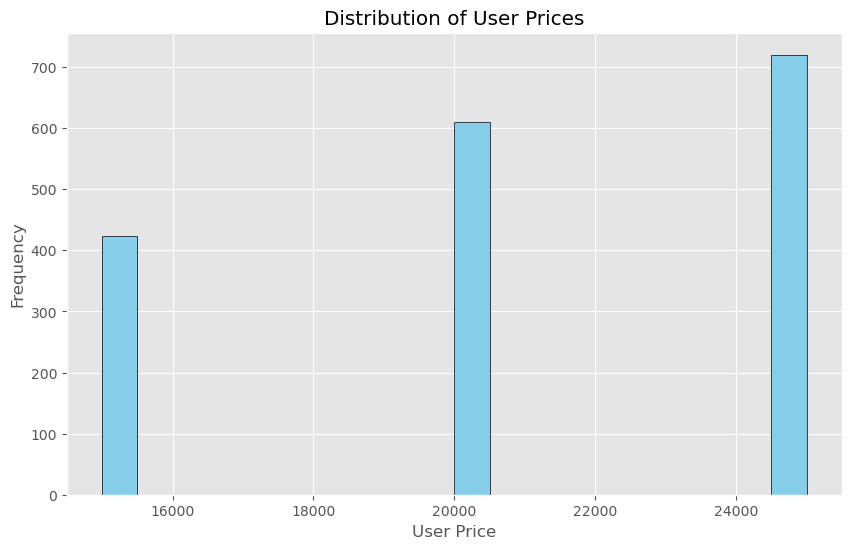

In [50]:
# Plot the distribution of user prices
plt.figure(figsize=(10, 6))
plt.hist(contracts['user_price'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of User Prices')
plt.xlabel('User Price')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


In [51]:
# Merge contracts with leads to get company size and industry information
contracts_leads = pd.merge(contracts, leads[['leads_id', 'company_size', 'industry_code']], on='leads_id', how='left')
# Analyze Contract Distribution by Company Size
contract_distribution_company_size = contracts_leads.groupby('company_size').agg(
    total_contracts=('contract_id', 'nunique'),
    avg_user_price=('user_price', 'mean')
).reset_index()


contract_distribution_company_size

,company_size,total_contracts,avg_user_price
0,Big,317,15788.64353
1,Medium,950,20473.68421
2,Micro,46,25000.00000
3,Small,441,24841.26984


In [52]:
# Merge with industries to get industry information
contracts_industries = pd.merge(contracts_leads, industries, on='industry_code', how='left')
# Analyze Contract Distribution by Industry
contract_distribution_industry = contracts_industries.groupby('industry').agg(
    total_contracts=('contract_id', 'nunique'),
    avg_user_price=('user_price', 'mean')
).reset_index()

contract_distribution_industry

,industry,total_contracts,avg_user_price
0,Education,225,22333.33333
1,F&B,330,23075.75758
2,Finance,243,18168.72428
3,Hospitality,126,20515.87302
4,Retail,360,19972.22222
5,Technology,470,20702.12766


##  Contract Distribution by Company Size and Subscription Type

In [53]:
# Analyze Contract Distribution by Company Size and Subscription Type
contract_distribution_company_size_sub_type = contracts_leads.groupby(['company_size', 'subscription_type']).agg(
    total_contracts=('contract_id', 'nunique'),
    avg_user_price=('user_price', 'mean')
).reset_index()

contract_distribution_company_size_sub_type


,company_size,subscription_type,total_contracts,avg_user_price
0,Big,Business,6,25000.00000
1,Big,Enterprise,273,15000.00000
2,Big,Startup,38,20000.00000
3,Medium,Business,241,25000.00000
4,Medium,Enterprise,151,15000.00000
5,Medium,Startup,558,20000.00000
6,Micro,Business,46,25000.00000
7,Small,Business,427,25000.00000
8,Small,Startup,14,20000.00000


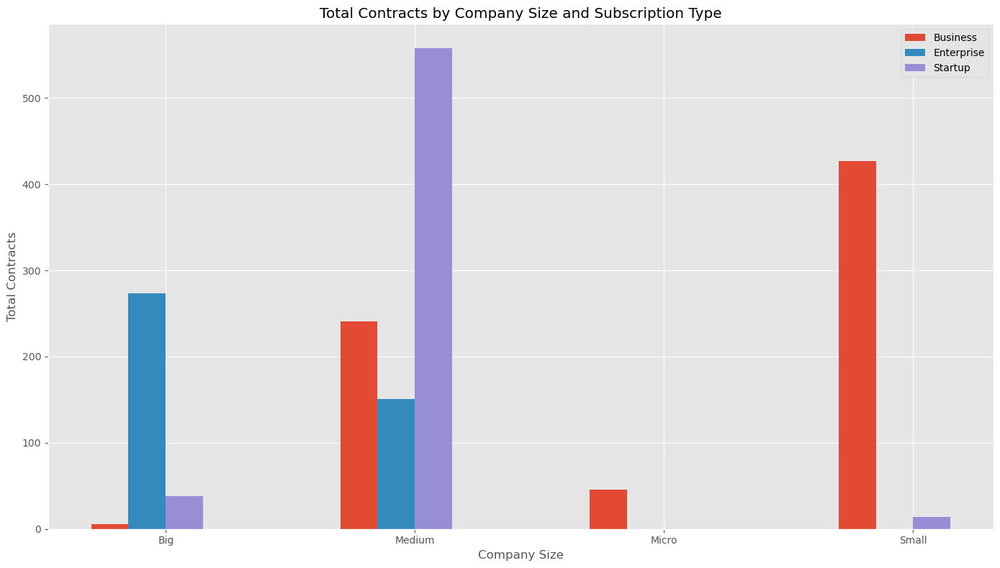

In [54]:
# Pivot the data for plotting
pivot_data = contract_distribution_company_size_sub_type.pivot(index='company_size', columns='subscription_type', values='total_contracts').fillna(0)

# Plotting the data
fig, ax = plt.subplots(figsize=(14, 8))

# Set the positions and width for the bars
bar_width = 0.15
positions = list(range(len(pivot_data)))

# Plot each subscription type
for i, sub_type in enumerate(pivot_data.columns):
    ax.bar(
        [p + bar_width * i for p in positions],
        pivot_data[sub_type],
        width=bar_width,
        label=sub_type
    )

# Set the x-ticks and labels
ax.set_xticks([p + bar_width * (len(pivot_data.columns) / 2) for p in positions])
ax.set_xticklabels(pivot_data.index)

# Add labels and title
ax.set_xlabel('Company Size')
ax.set_ylabel('Total Contracts')
ax.set_title('Total Contracts by Company Size and Subscription Type')
ax.legend()

file_path = "/Users/andi/Project/IEP SaaS Company Analaysis/Images/Total Contracts by Company Size and Subscription Type.png"

# Ensure the directory exists
os.makedirs(os.path.dirname(file_path), exist_ok=True)


# Save the image
plt.tight_layout()
plt.savefig(file_path, format='png')

# Display the plot
plt.show()

Insights:

- Big Companies: Most contracts are for the Enterprise subscription type, with 273 contracts at an average user price of $15,000.
- Medium Companies: The highest number of contracts is for the Startup subscription type, with 558 contracts at an average user price of $20,000.
- Micro Companies: Predominantly choose the Business subscription type, with 46 contracts at an average user price of $25,000.
- Small Companies: Mostly opt for the Business subscription type, with 427 contracts at an average user price of $25,000.

## Contract Distribution by Industry and Subscription Type

In [55]:
# Analyze Contract Distribution by Industry with breakdown by Company Size and Subscription Type
contract_distribution_industry_size_sub_type = contracts_industries.groupby(['industry', 'subscription_type']).agg(
    total_contracts=('contract_id', 'nunique'),
    avg_user_price=('user_price', 'mean')
).reset_index()

contract_distribution_industry_size_sub_type


,industry,subscription_type,total_contracts,avg_user_price
0,Education,Business,129,25000.00000
1,Education,Enterprise,24,15000.00000
2,Education,Startup,72,20000.00000
3,F&B,Business,237,25000.00000
4,F&B,Enterprise,34,15000.00000
5,F&B,Startup,59,20000.00000
6,Finance,Business,30,25000.00000
7,Finance,Enterprise,119,15000.00000
8,Finance,Startup,94,20000.00000
9,Hospitality,Business,52,25000.00000


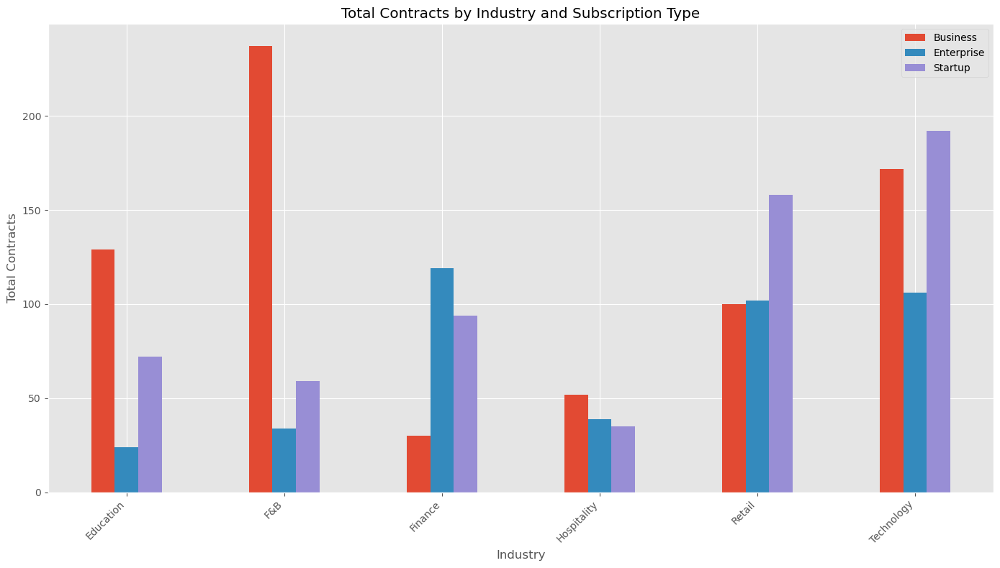

In [56]:
# Pivot the data for plotting
pivot_data = contract_distribution_industry_size_sub_type.pivot(index='industry', columns='subscription_type', values='total_contracts').fillna(0)

# Plotting the data
fig, ax = plt.subplots(figsize=(14, 8))

# Set the positions and width for the bars
bar_width = 0.15
industries = pivot_data.index
positions = list(range(len(industries)))

# Plot each subscription type
for i, sub_type in enumerate(pivot_data.columns):
    ax.bar(
        [p + bar_width * i for p in positions],
        pivot_data[sub_type],
        width=bar_width,
        label=sub_type
    )

# Set the x-ticks and labels
ax.set_xticks([p + bar_width * (len(pivot_data.columns) / 2 - 0.5) for p in positions])
ax.set_xticklabels(industries, rotation=45, ha="right")

# Add labels and title
ax.set_xlabel('Industry')
ax.set_ylabel('Total Contracts')
ax.set_title('Total Contracts by Industry and Subscription Type')
ax.legend()

file_path = "/Users/andi/Project/IEP SaaS Company Analaysis/Images/Total Contracts by Industry and Subscription Type.png"

# Ensure the directory exists
os.makedirs(os.path.dirname(file_path), exist_ok=True)


# Save the image
plt.tight_layout()
plt.savefig(file_path, format='png')

# Display the plot
plt.show()

Insights:

- Education: Most contracts are for the Business subscription type (129 contracts), followed by Startup (72 contracts) and Enterprise (24 contracts).
- F&B: The highest number of contracts is for the Business subscription type (237 contracts), followed by Startup (59 contracts) and Enterprise (34 contracts).
- Finance: Enterprise subscription type leads with 119 contracts, followed by Startup (94 contracts) and Business (30 contracts).
- Hospitality: Business subscription type is most common (52 contracts), followed by Enterprise (39 contracts) and Startup (35 contracts).
- Retail: Highest number of contracts for the Startup subscription type (158 contracts), followed by Business (100 contracts) and Enterprise (102 contracts).
- Technology: Most contracts for the Startup subscription type (192 contracts), followed by Business (172 contracts) and Enterprise (106 contracts).

## Contract Distribution by Industry, Company Size, and Subscription Type

In [57]:

# Analyze Contract Distribution by Industry with breakdown by Company Size and Subscription Type
contract_distribution_industry_size_sub_type = contracts_industries.groupby(['industry', 'company_size', 'subscription_type']).agg(
    total_contracts=('contract_id', 'nunique'),
    avg_user_price=('user_price', 'mean')
).reset_index()

contract_distribution_industry_size_sub_type


,industry,company_size,subscription_type,total_contracts,avg_user_price
0,Education,Big,Business,2,25000.00000
1,Education,Big,Enterprise,11,15000.00000
2,Education,Big,Startup,6,20000.00000
3,Education,Medium,Business,27,25000.00000
4,Education,Medium,Enterprise,13,15000.00000
5,Education,Medium,Startup,64,20000.00000
6,Education,Micro,Business,8,25000.00000
7,Education,Small,Business,92,25000.00000
8,Education,Small,Startup,2,20000.00000
9,F&B,Big,Enterprise,22,15000.00000


Insights:

- Education Industry: Small companies predominantly choose the Business subscription type, while big companies prefer the Enterprise subscription type.
- F&B Industry: Small companies mostly opt for the Business subscription type, whereas big companies tend to choose the Enterprise subscription type.
- Finance Industry: Big companies primarily select the Enterprise subscription type, with fewer choosing the Startup type.
- Hospitality Industry: Medium companies favor the Business and Startup subscription types, while big companies lean towards the Enterprise type.

Correlation Analysis

- Company Size and Subscription Type:

    - There is a clear correlation between company size and subscription type preferences.
    - Big companies tend to prefer the Enterprise subscription type.
    - Medium companies favor the Startup subscription type, possibly due to the balance between features and pricing.
    - Small and micro companies predominantly choose the Business subscription type, likely due to the affordability and sufficient feature set.

- Industry and Subscription Type:

    - Different industries have varying preferences for subscription types.
    - For example, the Finance industry shows a strong preference for the Enterprise subscription type, while the Retail industry favors the Startup subscription type.
    - The correlation between industry and subscription type indicates that industry-specific needs and budget constraints influence the choice of subscription model.

Conclusion

- Effect of Company Size on Subscription Model:

    Company size significantly affects the choice of subscription model. Larger companies tend to opt for more comprehensive plans like Enterprise, while smaller companies prefer more affordable options like Business or Startup.

- Correlation Between Company Size and Subscription Model:

    A strong correlation exists, with larger companies gravitating towards higher-tier subscription models.

- Correlation Between Industry and Subscription Model:

    There is also a notable correlation between industry and subscription model, influenced by industry-specific requirements and budget considerations.

## Analysis of Correlation between Company Size and User Price

In [58]:
from scipy.stats import pearsonr
# Assign numerical values to company sizes for correlation calculation
size_mapping = {'Micro': 1, 'Small': 2, 'Medium': 3, 'Big': 4}
contracts_leads['company_size_num'] = contracts_leads['company_size'].map(size_mapping)

# Calculate the correlation between company size and user price
correlation, p_value = pearsonr(contracts_leads['company_size_num'], contracts_leads['user_price'])

correlation, p_value

(-0.7489900389198305, 1.64598392e-315)

Insights:
- Correlation Coefficient (r = -0.74899):

    - The correlation coefficient is -0.74899, indicating a strong negative correlation between company size and user price.
    - This means that as company size increases, the user price tends to decrease.

- P-Value (1.64598392e-315):

    - The p-value is extremely small (close to 0), indicating that the correlation is statistically significant.
    - This means we can confidently say that there is a strong negative relationship between company size and user price.

Interpretation:
- Larger Companies Pay Less:

    - Larger companies (Big and Medium) tend to opt for subscription types that have a lower average user price compared to smaller companies (Small and Micro).
    - This could be due to larger companies negotiating better deals, opting for bulk pricing, or having different requirements that lead to lower per-user costs.
- Smaller Companies Pay More:

    - Smaller companies (Small and Micro) tend to pay more on average for their subscriptions.
    - This might be because they require fewer users but need higher-value features, or they are less capable of negotiating lower prices.

Strategic Recommendations:
1. Pricing Strategy:

Consider offering tiered pricing that accommodates both large and small companies. Ensure that pricing reflects the value provided to each segment.
Explore volume discounts or custom pricing for larger companies to incentivize them to subscribe while maintaining profitability.

2. Value Proposition:

Highlight different value propositions for different company sizes. For larger companies, emphasize cost savings and scalability. For smaller companies, focus on high-value features and personalized support.

3. Negotiation and Custom Deals:

Be open to negotiating custom deals with larger clients to secure their business while ensuring that smaller clients feel they are getting value for their higher per-user costs.

In [59]:
from scipy.stats import pearsonr
# Assign numerical values to company sizes for correlation calculation
size_mapping = {'Micro': 1, 'Small': 2, 'Medium': 3, 'Big': 4}
contracts_leads['company_size_num'] = contracts_leads['company_size'].map(size_mapping)

# Calculate the correlation between company size and user price
correlation, p_value = pearsonr(contracts_leads['company_size_num'], contracts_leads['user_price'])

correlation, p_value

(-0.7489900389198305, 1.64598392e-315)

In [60]:
# Assign numerical values to industries for correlation calculation
contracts_industries['industry_num'] = contracts_industries['industry_code']

# Calculate the correlation between industry and user price
correlation, p_value = pearsonr(contracts_industries['industry_num'], contracts_industries['user_price'])

correlation, p_value

(-0.18091018556092237, 2.269908305468836e-14)

Insights:

- Correlation Coefficient (r = -0.1809):

    - The correlation coefficient is -0.1809, indicating a weak negative correlation between industry and user price.
    - This means that there is a slight tendency for user prices to vary with industry, but the relationship is weak.

- P-Value (2.269908305468836e-14):

    - The p-value is extremely small (close to 0), indicating that the correlation is statistically significant.
    - This means we can confidently say that there is some relationship between industry and user price, even though it is weak.

Interpretation:
- Weak Correlation:

    - The weak negative correlation suggests that while industry does have an effect on user prices, it is not a strong determining factor.
    - Other factors such as company size, subscription type, and specific customer needs might play a more significant role in determining user prices.

- Industry-Specific Pricing:

    - Although the correlation is weak, certain industries may still show trends in user pricing. For example, industries with higher compliance and regulatory requirements (like Finance) may have different pricing structures compared to more straightforward sectors (like F&B).

# User Analysis

## Existing Customer 

In [61]:
lead_contract = leads.merge(contracts, on='leads_id', how= 'left')

In [62]:
lead_contract.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4250 entries, 0 to 4249
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype              
---  ------                --------------  -----              
 0   leads_id              4250 non-null   int64              
 1   session_source_code   4250 non-null   int64              
 2   industry_code         4250 non-null   int64              
 3   leads_registered      4250 non-null   datetime64[ns, UTC]
 4   number_of_employee_x  4250 non-null   int64              
 5   month_year            4250 non-null   period[M]          
 6   company_size          4250 non-null   object             
 7   contract_id           1754 non-null   float64            
 8   date                  1754 non-null   object             
 9   subscription_type     1754 non-null   object             
 10  number_of_employee_y  1754 non-null   float64            
 11  reten_flag            1754 non-null   float64            
 12  user_p

In [63]:
# Filter by retention flag
new_customers = lead_contract[lead_contract['reten_flag'] == 0]
existing_customers = lead_contract[lead_contract['reten_flag'] == 1]


In [64]:
new_customers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 901 entries, 3 to 4246
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype              
---  ------                --------------  -----              
 0   leads_id              901 non-null    int64              
 1   session_source_code   901 non-null    int64              
 2   industry_code         901 non-null    int64              
 3   leads_registered      901 non-null    datetime64[ns, UTC]
 4   number_of_employee_x  901 non-null    int64              
 5   month_year            901 non-null    period[M]          
 6   company_size          901 non-null    object             
 7   contract_id           901 non-null    float64            
 8   date                  901 non-null    object             
 9   subscription_type     901 non-null    object             
 10  number_of_employee_y  901 non-null    float64            
 11  reten_flag            901 non-null    float64            
 12  user_price  

In [65]:
new_customers['contract_id'].unique

<bound method Series.unique of 3       119.00000
14      662.00000
16      666.00000
18      668.00000
30       34.00000
32       51.00000
34       78.00000
40      262.00000
41      306.00000
47      485.00000
50      583.00000
57     1209.00000
61      115.00000
64      170.00000
69      394.00000
75      720.00000
82      923.00000
87     1023.00000
89     1094.00000
93     1202.00000
97      101.00000
99      127.00000
107     484.00000
112     538.00000
118     826.00000
120     916.00000
122     924.00000
124    1122.00000
130      68.00000
137     187.00000
140     293.00000
142     290.00000
144     304.00000
147     328.00000
149     336.00000
151     434.00000
154     625.00000
165      77.00000
169     107.00000
171     136.00000
183     606.00000
188     817.00000
192    1117.00000
207     372.00000
238     771.00000
244    1166.00000
248     951.00000
251      23.00000
259     106.00000
262     197.00000
265     332.00000
268     431.00000
270     464.00000
286     161.000

In [66]:
existing_customers['contract_id'].unique

<bound method Series.unique of 4       631.00000
15     1413.00000
17     1416.00000
19     1417.00000
31      436.00000
33      466.00000
35      525.00000
39      981.00000
42     1127.00000
48     1306.00000
51     1363.00000
58     1747.00000
62      627.00000
65      736.00000
68     1253.00000
76     1444.00000
83     1570.00000
86     1627.00000
88     1674.00000
94     1745.00000
96      591.00000
100     658.00000
108    1307.00000
111    1332.00000
117    1512.00000
121    1562.00000
123    1567.00000
125    1690.00000
131     508.00000
138     821.00000
141    1077.00000
143    1083.00000
145    1115.00000
148    1184.00000
150    1208.00000
152    1279.00000
155    1393.00000
166     523.00000
168     611.00000
172     673.00000
182    1378.00000
187    1509.00000
193    1694.00000
208    1241.00000
239    1474.00000
245    1722.00000
249    1583.00000
252     396.00000
260     613.00000
263     845.00000
266    1191.00000
267    1278.00000
271    1292.00000
287     725.000

In [67]:
existing_customers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 853 entries, 4 to 4245
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype              
---  ------                --------------  -----              
 0   leads_id              853 non-null    int64              
 1   session_source_code   853 non-null    int64              
 2   industry_code         853 non-null    int64              
 3   leads_registered      853 non-null    datetime64[ns, UTC]
 4   number_of_employee_x  853 non-null    int64              
 5   month_year            853 non-null    period[M]          
 6   company_size          853 non-null    object             
 7   contract_id           853 non-null    float64            
 8   date                  853 non-null    object             
 9   subscription_type     853 non-null    object             
 10  number_of_employee_y  853 non-null    float64            
 11  reten_flag            853 non-null    float64            
 12  user_price  

In [68]:
# Extract year from the date column in the contracts dataset
existing_customers['year'] = pd.to_datetime(existing_customers['date']).dt.year

# Calculate the retention rate for each year
retention_rate_by_year = existing_customers.groupby('year').apply(
    lambda x: pd.Series({
        'total_customers': x['leads_id'].nunique(),
        'retained_customers': x[x['reten_flag'] == 1]['leads_id'].nunique(),
        'retention_rate': x[x['reten_flag'] == 1]['leads_id'].nunique() / x['leads_id'].nunique() * 100
    })
).reset_index()

print(retention_rate_by_year)

   year  total_customers  retained_customers  retention_rate
0  2022        325.00000           325.00000       100.00000
1  2023        528.00000           528.00000       100.00000


/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_4595/559706453.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [69]:
existing_customers['revenue'] = existing_customers['user_price'] * existing_customers['number_of_employee_x']
total_revenue_existing_customers = existing_customers['revenue'].sum()

count_existing_customers = existing_customers['leads_id'].nunique()
print(f"Total Revenue from Existing Customers: {total_revenue_existing_customers}")
print(f"Number of Existing Customers: {count_existing_customers}")


Total Revenue from Existing Customers: 2127700000.0
Number of Existing Customers: 853


/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_4595/597263807.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Total Revenue from Existing Customers: $2.127.700.000
Number of Existing Customers: 853

394 data yang harusnya balik atau deal won 

In [70]:
# Get the leads_id for the deals won stage
deal_won_leads = funnels_stages[funnels_stages['stage'] == 'deal_won']['leads_id'].unique()

# Display the data of the customer lead_id who have a deal won
deal_won_leads_data = leads[leads['leads_id'].isin(deal_won_leads)]

In [71]:
deal_won_leads_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 901 entries, 3 to 3393
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   leads_id             901 non-null    int64              
 1   session_source_code  901 non-null    int64              
 2   industry_code        901 non-null    int64              
 3   leads_registered     901 non-null    datetime64[ns, UTC]
 4   number_of_employee   901 non-null    int64              
 5   month_year           901 non-null    period[M]          
 6   company_size         901 non-null    object             
dtypes: datetime64[ns, UTC](1), int64(4), object(1), period[M](1)
memory usage: 56.3+ KB


In [72]:
# Filter for only deal won leads
deal_won_leads_data = existing_customers[existing_customers['leads_id'].isin(deal_won_leads)]

# Calculate revenue for deal won leads
deal_won_leads_data['revenue'] = deal_won_leads_data['user_price'] * deal_won_leads_data['number_of_employee_x']
total_revenue_deal_won_existing_customers = deal_won_leads_data['revenue'].sum()
count_deal_won_existing_customers = deal_won_leads_data['leads_id'].nunique()

(total_revenue_deal_won_existing_customers, count_deal_won_existing_customers)

(2127700000.0, 853)

In [73]:
existing_customers['leads_id'].unique

<bound method Series.unique of 4        437
15      2044
17      2062
19      2083
31       170
33       185
35       314
39      1041
42      1162
48      1652
51      1878
58      3375
62       416
65       630
68      1366
76      2162
83      2679
86      2924
88      3134
94      3355
96       395
100      490
108     1666
111     1808
117     2481
121     2664
123     2673
125     3108
131      272
138      751
141     1120
143     1146
145     1161
148     1261
150     1304
152     1543
155     1994
166      301
168      426
172      531
182     1890
187     2462
193     3167
208     1409
239     2342
245     3243
249     2724
252       73
260      440
263      793
266     1274
267     1541
271     1589
287      665
291     1341
298     2029
300     2275
302     2439
304     2503
309     3037
312     3130
317      678
324     1555
328     1754
334      662
336     1377
338     3187
340     3336
343      501
345      523
348     2058
352     2945
359     1928
371     1493
373    

## New Custoner

In [74]:
new_customers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 901 entries, 3 to 4246
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype              
---  ------                --------------  -----              
 0   leads_id              901 non-null    int64              
 1   session_source_code   901 non-null    int64              
 2   industry_code         901 non-null    int64              
 3   leads_registered      901 non-null    datetime64[ns, UTC]
 4   number_of_employee_x  901 non-null    int64              
 5   month_year            901 non-null    period[M]          
 6   company_size          901 non-null    object             
 7   contract_id           901 non-null    float64            
 8   date                  901 non-null    object             
 9   subscription_type     901 non-null    object             
 10  number_of_employee_y  901 non-null    float64            
 11  reten_flag            901 non-null    float64            
 12  user_price  

In [75]:
# Perform the joins lead_contract_discount_discounttype
# Perform the merges
lead_contract_discount_discounttype = leads.merge(contracts, on='leads_id', how= 'left')\
                                            .merge(discounts, on='contract_id', how= 'left')\
                                            .merge(discount_types, on='discount_type_code', how= 'left')



In [76]:
lead_contract_discount_discounttype.dtypes

leads_id                              int64
session_source_code                   int64
industry_code                         int64
leads_registered        datetime64[ns, UTC]
number_of_employee_x                  int64
month_year                        period[M]
company_size                         object
contract_id                         float64
date                                 object
subscription_type                    object
number_of_employee_y                float64
reten_flag_x                        float64
user_price                          float64
GMV                                 float64
discount_type_code                   object
deal_won                             object
user_price_after                    float64
reten_flag_y                        float64
discount_type                        object
month_discount                       object
dtype: object

In [77]:
lead_contract_discount_discounttype.head()

,leads_id,session_source_code,industry_code,leads_registered,number_of_employee_x,month_year,company_size,contract_id,date,subscription_type,number_of_employee_y,reten_flag_x,user_price,GMV,discount_type_code,deal_won,user_price_after,reten_flag_y,discount_type,month_discount
0,244,1,1,2021-02-03 14:36:48+00:00,5,2021-02,Micro,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,290,4,1,2021-02-23 14:27:36+00:00,5,2021-02,Micro,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,425,1,1,2021-03-30 15:10:12+00:00,5,2021-03,Micro,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,437,4,1,2021-04-01 15:39:02+00:00,5,2021-04,Micro,119.00000,2021-05-03,Business,5.00000,0.00000,25000.00000,125000.00000,NaN,NaN,NaN,NaN,NaN,NaN
4,437,4,1,2021-04-01 15:39:02+00:00,5,2021-04,Micro,631.00000,2022-05-03,Business,5.00000,1.00000,25000.00000,125000.00000,NaN,NaN,NaN,NaN,NaN,NaN


In [78]:
# Filter by retention flag
new_customers = lead_contract_discount_discounttype[lead_contract_discount_discounttype['reten_flag_x'] == 0]
existing_customers = lead_contract_discount_discounttype[lead_contract_discount_discounttype['reten_flag_x'] == 1]

# Calculate average final price for new and existing customers
avg_final_price_new_customers = new_customers['user_price_after'].mean()
avg_final_price_existing_customers = existing_customers['user_price_after'].mean()

print(f"Average Final Price for New Customers: {avg_final_price_new_customers}")
print(f"Average Final Price for Existing Customers: {avg_final_price_existing_customers}")

Average Final Price for New Customers: 17700.226244343892
Average Final Price for Existing Customers: nan


In [79]:
new_customers['revenue'] = new_customers['user_price'] * new_customers['number_of_employee_x']
total_revenue_existing_customers = new_customers['revenue'].sum()

count_existing_customers = new_customers['leads_id'].nunique()
print(f"Total Revenue from new Customers: {total_revenue_existing_customers}")
print(f"Number of new Customers: {count_existing_customers}")


Total Revenue from new Customers: 2272325000.0
Number of new Customers: 901


/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_4595/4081547699.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [80]:
new_customers['leads_id'].unique

<bound method Series.unique of 3        437
14      2044
16      2062
18      2083
30       170
32       185
34       314
40      1041
41      1162
47      1652
50      1878
57      3375
61       416
64       630
69      1366
75      2162
82      2679
87      2924
89      3134
93      3355
97       395
99       490
107     1666
112     1808
118     2481
120     2664
122     2673
124     3108
130      272
137      751
140     1120
142     1146
144     1161
147     1261
149     1304
151     1543
154     1994
165      301
169      426
171      531
183     1890
188     2462
192     3167
207     1409
238     2342
244     3243
248     2724
251       73
259      440
262      793
265     1274
268     1541
270     1589
286      665
290     1341
297     2029
299     2275
301     2439
303     2503
308     3037
311     3130
318      678
323     1555
326     1706
327     1754
333      662
335     1377
337     3187
339     3336
342      501
344      523
347     2058
351     2945
358     1928
370    

## New Existing User Analysis

In [81]:
# # Calculate the retention rate for each year

# # Convert the date column to datetime
# contracts['date'] = pd.to_datetime(contracts['date'])

# # Extract the year from the date column
# contracts['year'] = contracts['date'].dt.year

# # Calculate the number of retained contracts for each year
# retained_contracts = contracts[contracts['reten_flag'] == 1].groupby('year')['contract_id'].count().reset_index()
# retained_contracts.columns = ['year', 'retained_contracts']

# # Calculate the total number of contracts for each year
# total_contracts = contracts.groupby('year')['contract_id'].count().reset_index()
# total_contracts.columns = ['year', 'total_contracts']

# # Merge the two dataframes to calculate the retention rate
# retention_rate_df = pd.merge(retained_contracts, total_contracts, on='year')
# retention_rate_df['retention_rate'] = (retention_rate_df['retained_contracts'] / retention_rate_df['total_contracts']) * 100

# retention_rate_df


## New user ANalaysis

In [82]:
# # Calculate the number of new users for each year

# # Calculate the number of new contracts (new users) for each year
# new_contracts = contracts[contracts['reten_flag'] == 0].groupby('year')['contract_id'].count().reset_index()
# new_contracts.columns = ['year', 'new_users']

# new_contracts


# Revenue Analysis 


In [88]:
# Merge relevant datasets for initial analysis

# Merge leads with session_sources and industries to get complete leads information
leads_full = leads.merge(session_sources, on='session_source_code', how='left').merge(industries, on='industry_code', how='left')

# Merge contracts with leads_full to get leads information for each contract
contracts_full = contracts.merge(leads_full, on='leads_id', how='left')

# Merge discounts with discount_types to get complete discount information
discounts_full = discounts.merge(discount_types, on='discount_type_code', how='left')

# Merge contracts_full with discounts_full to get discount information for each contract
contracts_with_discounts = contracts_full.merge(discounts_full, on='contract_id', how='left')

# Convert date columns to datetime
contracts_with_discounts['date'] = pd.to_datetime(contracts_with_discounts['date'])
discounts_full['deal_won'] = pd.to_datetime(discounts_full['deal_won'])
leads_full['leads_registered'] = pd.to_datetime(leads_full['leads_registered'])

# Filter data for the years 2021 and 2022
contracts_2021 = contracts_with_discounts[contracts_with_discounts['date'].dt.year == 2021]
contracts_2022 = contracts_with_discounts[contracts_with_discounts['date'].dt.year == 2022]

# Calculate total revenue and number of contracts for 2021 and 2022
revenue_2021 = contracts_2021['GMV'].sum()
revenue_2022 = contracts_2022['GMV'].sum()
num_contracts_2021 = contracts_2021['contract_id'].nunique()
num_contracts_2022 = contracts_2022['contract_id'].nunique()

# Calculate total revenue and number of contracts for 2021 and 2022 with discounts
revenue_discounts_2021 = contracts_2021[contracts_2021['discount_type_code'].notnull()]['GMV'].sum()
revenue_discounts_2022 = contracts_2022[contracts_2022['discount_type_code'].notnull()]['GMV'].sum()
num_contracts_discounts_2021 = contracts_2021[contracts_2021['discount_type_code'].notnull()]['contract_id'].nunique()
num_contracts_discounts_2022 = contracts_2022[contracts_2022['discount_type_code'].notnull()]['contract_id'].nunique()

# Display the results
summary = {
    "Total Revenue 2021": revenue_2021,
    "Total Revenue 2022": revenue_2022,
    "Number of Contracts 2021": num_contracts_2021,
    "Number of Contracts 2022": num_contracts_2022,
    "Revenue with Discounts 2021": revenue_discounts_2021,
    "Revenue with Discounts 2022": revenue_discounts_2022,
    "Contracts with Discounts 2021": num_contracts_discounts_2021,
    "Contracts with Discounts 2022": num_contracts_discounts_2022,
}

summary


{'Total Revenue 2021': 778387500,
 'Total Revenue 2022': 2052240000,
 'Number of Contracts 2021': 347,
 'Number of Contracts 2022': 879,
 'Revenue with Discounts 2021': 318487500,
 'Revenue with Discounts 2022': 611740000,
 'Contracts with Discounts 2021': 144,
 'Contracts with Discounts 2022': 298}

Summary of Revenue and Contracts for 2021 and 2022


- Total Revenue:

    - 2021: $778,387,500
    - 2022: $2,052,240,000

- Number of Contracts:

    - 2021: 347 contracts
    - 2022: 879 contracts

- Revenue with Discounts:

    - 2021: $318,487,500
    - 2022: $611,740,000

- Number of Contracts with Discounts:

    - 2021: 144 contracts
    - 2022: 298 contracts

Observations:
1. There was a significant increase in both the total revenue and the number of contracts from 2021 to 2022.
2. The revenue and the number of contracts associated with discounts also increased notably in 2022 compared to 2021.

- 43% of our contract in 2021 use discount
- 34% of our contract in 2022 use discount
- 2021 to 2022 increase 60 percent of user

In [ ]:
# Extract the month from the contract date to identify promotion periods (January, April, July, October)
contracts_with_discounts['month'] = contracts_with_discounts['date'].dt.month

# Define promotion months for 2021 and 2022
promotion_months = [1, 4, 7, 10]

# Separate contracts into promotion and non-promotion periods for both years
promotion_contracts_2021 = contracts_with_discounts[(contracts_with_discounts['date'].dt.year == 2021) & (contracts_with_discounts['month'].isin(promotion_months))]
non_promotion_contracts_2021 = contracts_with_discounts[(contracts_with_discounts['date'].dt.year == 2021) & (~contracts_with_discounts['month'].isin(promotion_months))]

promotion_contracts_2022 = contracts_with_discounts[(contracts_with_discounts['date'].dt.year == 2022) & (contracts_with_discounts['month'].isin(promotion_months))]
non_promotion_contracts_2022 = contracts_with_discounts[(contracts_with_discounts['date'].dt.year == 2022) & (~contracts_with_discounts['month'].isin(promotion_months))]

# Calculate total revenue and number of contracts for promotion and non-promotion periods
promotion_summary = {
    "Promotion Revenue 2021": promotion_contracts_2021['GMV'].sum(),
    "Non-Promotion Revenue 2021": non_promotion_contracts_2021['GMV'].sum(),
    "Promotion Contracts 2021": promotion_contracts_2021['contract_id'].nunique(),
    "Non-Promotion Contracts 2021": non_promotion_contracts_2021['contract_id'].nunique(),
    "Promotion Revenue 2022": promotion_contracts_2022['GMV'].sum(),
    "Non-Promotion Revenue 2022": non_promotion_contracts_2022['GMV'].sum(),
    "Promotion Contracts 2022": promotion_contracts_2022['contract_id'].nunique(),
    "Non-Promotion Contracts 2022": non_promotion_contracts_2022['contract_id'].nunique(),
}

promotion_summary_df = pd.DataFrame([promotion_summary])

promotion_summary


{'Promotion Revenue 2021': 318487500,
 'Non-Promotion Revenue 2021': 459900000,
 'Promotion Contracts 2021': 144,
 'Non-Promotion Contracts 2021': 203,
 'Promotion Revenue 2022': 932790000,
 'Non-Promotion Revenue 2022': 1119450000,
 'Promotion Contracts 2022': 432,
 'Non-Promotion Contracts 2022': 447}

Promotion vs Non-Promotion Period Analysis

1. Promotion Periods:

- 2021:
    - Revenue: $318,487,500
    - Number of Contracts: 144
- 2022:
    - Revenue: $932,790,000
    - Number of Contracts: 432

2. Non-Promotion Periods:

- 2021:
    - Revenue: $459,900,000
    - Number of Contracts: 203
- 2022:
    - Revenue: $1,119,450,000
    - Number of Contracts: 447

Observations:
1. The revenue and number of contracts during promotion periods increased significantly from 2021 to 2022.
2. The non-promotion periods also saw an increase in both revenue and number of contracts in 2022 compared to 2021, but the growth during promotion periods was more pronounced.

In [ ]:
# Analyze performance by subscription type for 2021 and 2022

# Group by subscription type and year to get total revenue and number of contracts for each type
subscription_performance_2021 = contracts_2021.groupby('subscription_type').agg(
    total_revenue=('GMV', 'sum'),
    number_of_contracts=('contract_id', 'nunique')
).reset_index()

subscription_performance_2022 = contracts_2022.groupby('subscription_type').agg(
    total_revenue=('GMV', 'sum'),
    number_of_contracts=('contract_id', 'nunique')
).reset_index()

# Combine both years for comparison
subscription_performance = subscription_performance_2021.merge(
    subscription_performance_2022,
    on='subscription_type',
    suffixes=('_2021', '_2022')
)
subscription_performance


,subscription_type,total_revenue_2021,number_of_contracts_2021,total_revenue_2022,number_of_contracts_2022
0,Business,144350000,148,417900000,362
1,Enterprise,321097500,75,922200000,218
2,Startup,312940000,124,712140000,299


Total Revenue and Number of Contracts by Subscription Type
1. Business:

- 2021:
    - Total Revenue: $144,350,000
    - Number of Contracts: 148
- 2022:
    - Total Revenue: $417,900,000
    - Number of Contracts: 362

2. Enterprise:

- 2021:
    - Total Revenue: $321,097,500
    - Number of Contracts: 75
- 2022:
    - Total Revenue: $922,200,000
    - Number of Contracts: 218

3. Startup:

- 2021:
    - Total Revenue: $312,940,000
    - Number of Contracts: 124
- 2022:
    - Total Revenue: $712,140,000
    - Number of Contracts: 299


Observations:
- There was a significant increase in both total revenue and number of contracts for all subscription types from 2021 to 2022.
- The "Enterprise" subscription type had the highest total revenue increase, followed by "Startup" and "Business."

# Discount Impact Analysis and  Price Elsaticity of Demand Analysis 

In [ ]:
# Convert date columns to datetime
contracts['date'] = pd.to_datetime(contracts['date'])

# Filter contracts for 2021 and 2022
contracts_2021 = contracts[contracts['date'].dt.year == 2021]
contracts_2022 = contracts[contracts['date'].dt.year == 2022]

# Aggregate the number of contracts and revenue for 2021 and 2022
contracts_summary = pd.DataFrame({
    'Year': [2021, 2022],
    'Total Contracts': [contracts_2021.shape[0], contracts_2022.shape[0]],
    'Total Revenue': [contracts_2021['GMV'].sum(), contracts_2022['GMV'].sum()]
})



contracts_summary


,Year,Total Contracts,Total Revenue
0,2021,347,778387500
1,2022,879,2052240000


In [ ]:
# Merge contracts with discounts to analyze the impact of promotions
contracts_discounts = pd.merge(contracts, discounts, on='contract_id', how='left')
contracts_discounts = pd.merge(contracts_discounts, discount_types, on='discount_type_code', how='left')

# Add a column to indicate if a discount was applied
contracts_discounts['discount_applied'] = contracts_discounts['discount_type_code'].notna()

# Group by year and discount applied to compare the number of contracts
discount_impact_summary = contracts_discounts.groupby([contracts_discounts['date'].dt.year, 'discount_applied']).size().unstack(fill_value=0)

# Evaluate the performance of each subscription type under the 2021 and 2022 promotions
subscription_performance = contracts_discounts.groupby([contracts_discounts['date'].dt.year, 'subscription_type', 'discount_applied']).size().unstack(fill_value=0)

discount_impact_summary, subscription_performance


(discount_applied  False  True 
 date                          
 2021                203    144
 2022                581    298
 2023                528      0,
 discount_applied        False  True 
 date subscription_type              
 2021 Business              86     62
      Enterprise            44     31
      Startup               73     51
 2022 Business             224    138
      Enterprise           161     57
      Startup              196    103
 2023 Business             210      0
      Enterprise           131      0
      Startup              187      0)

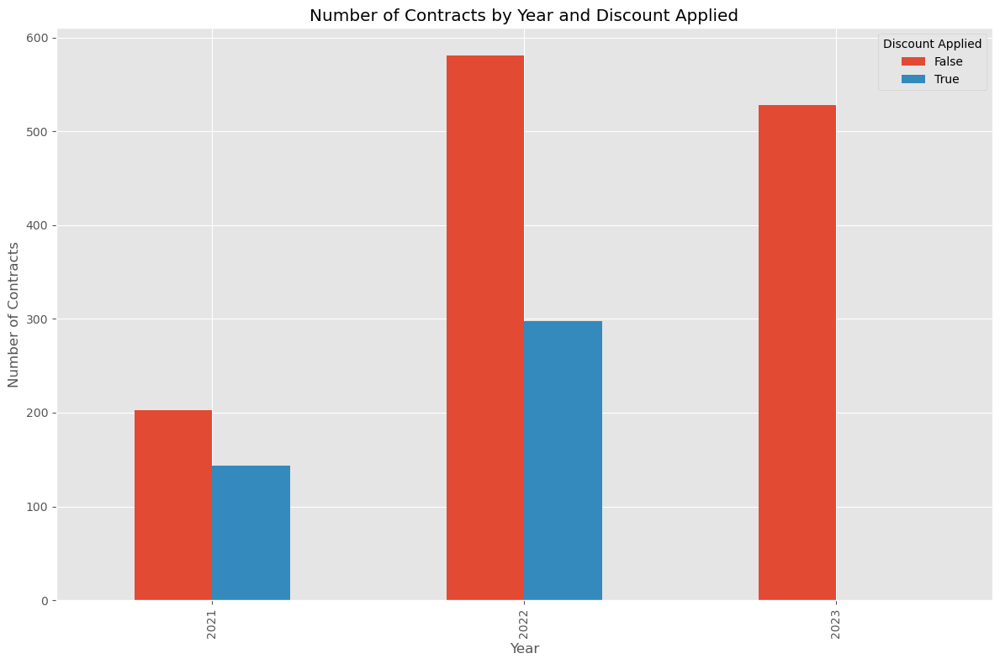

In [ ]:
# Plotting the data
fig, ax = plt.subplots(figsize=(12, 8))

discount_impact_summary.plot(kind='bar', ax=ax)

# Set labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Number of Contracts')
ax.set_title('Number of Contracts by Year and Discount Applied')
ax.legend(title='Discount Applied')

# Show the plot
plt.tight_layout()
plt.show()

- Discount Impact Summary

1. 2021:
    - Contracts without discounts: 203
    - Contracts with discounts: 144

2. 2022:
    - Contracts without discounts: 581
    - Contracts with discounts: 298

- Subscription Performance by Year and Discount Applied

1. 2021:
- Business:
    - Without discount: 86
    - With discount: 62
- Enterprise:
    - Without discount: 44
    - With discount: 31
- Startup:
    - Without discount: 73
    - With discount: 51

2. 2022:
- Business:
    - Without discount: 224
    - With discount: 138
- Enterprise:
    - Without discount: 161
    - With discount: 57
- Startup:
    - Without discount: 196
    - With discount: 103


Insights
1. Overall Impact of Promotions:

    - The number of contracts increased significantly from 2021 to 2022, indicating that the promotions had a positive impact on customer acquisition.
    - The increase in contracts without discounts in 2022 suggests that while promotions attracted new customers, the overall marketing and sales efforts also improved.

2. Subscription Type Performance:

    - The "Business" subscription type saw the highest number of contracts, both with and without discounts.
    - The "Enterprise" subscription type had fewer contracts compared to "Business" and "Startup" types, indicating a potential area for improvement in targeting or offering for this segment.
    - The promotions in 2022 seemed to be more effective for the "Startup" and "Business" subscription types compared to "Enterprise."

In [ ]:
# Function to calculate price elasticity of demand (PED)
def calculate_ped(data, subscription_type):
    # Filter data for the given subscription type
    sub_data = data[data['subscription_type'] == subscription_type]
    
    # Group by year and calculate average price and quantity sold
    yearly_data = sub_data.groupby(sub_data['date'].dt.year).agg({
        'user_price_after': 'mean',
        'contract_id': 'count'
    }).rename(columns={'user_price_after': 'avg_price', 'contract_id': 'quantity'})
    
    # Calculate percentage changes in price and quantity
    yearly_data['price_change'] = yearly_data['avg_price'].pct_change()
    yearly_data['quantity_change'] = yearly_data['quantity'].pct_change()
    
    # Calculate PED
    yearly_data['ped'] = yearly_data['quantity_change'] / yearly_data['price_change']
    
    return yearly_data

# Calculate PED for each subscription type
business_ped = calculate_ped(contracts_discounts, 'Business')
enterprise_ped = calculate_ped(contracts_discounts, 'Enterprise')
startup_ped = calculate_ped(contracts_discounts, 'Startup')


business_ped


/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_60571/2978377246.py:13: FutureWarning:

The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.

/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_60571/2978377246.py:13: FutureWarning:

The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.

/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_60571/2978377246.py:13: FutureWarning:

The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



,avg_price,quantity,price_change,quantity_change,ped
date,,,,,
2021,22500.00000,148,NaN,NaN,NaN
2022,20000.00000,362,-0.11111,1.44595,-13.01351
2023,NaN,210,0.00000,-0.41989,-inf


In [ ]:
enterprise_ped

,avg_price,quantity,price_change,quantity_change,ped
date,,,,,
2021,13500.00000,75,NaN,NaN,NaN
2022,12000.00000,218,-0.11111,1.90667,-17.16000
2023,NaN,131,0.00000,-0.39908,-inf


In [ ]:
startup_ped

,avg_price,quantity,price_change,quantity_change,ped
date,,,,,
2021,18000.00000,124,NaN,NaN,NaN
2022,16000.00000,299,-0.11111,1.41129,-12.70161
2023,NaN,187,0.00000,-0.37458,-inf


Insights
1. High Elasticity: All subscription types show very high elasticity (high absolute values of PED). This indicates that the quantity demanded is highly responsive to changes in price.
2. Negative PED Values: The negative PED values indicate that the quantity demanded increases as prices decrease, which is typical for normal goods.
3. Price Changes and Demand: The significant increase in quantity demanded in 2022 compared to 2021 when prices were reduced confirms that price reductions were effective in attracting more customers.

In [ ]:
# Define the function to calculate detailed pricing recommendations
def detailed_pricing_recommendations(current_price, elasticity, current_quantity, price_reduction_percent):
    # Calculate new price
    new_price = current_price * (1 - price_reduction_percent)
    
    # Calculate % change in quantity using elasticity
    quantity_increase_percent = elasticity * (-price_reduction_percent)
    
    # Calculate estimated new quantity
    estimated_new_quantity = current_quantity * (1 + quantity_increase_percent)
    
    return {
        'Current Price': current_price,
        'New Price': new_price,
        'Estimated Quantity Increase (%)': quantity_increase_percent * 100,
        'Estimated New Quantity': estimated_new_quantity
    }

# Current prices, elasticities, and quantities for each subscription type
business_current_price = 20000
business_elasticity = -13.013514
business_current_quantity = 362

enterprise_current_price = 12000
enterprise_elasticity = -17.16
enterprise_current_quantity = 218

startup_current_price = 16000
startup_elasticity = -12.701613
startup_current_quantity = 299

# Price reduction percent
price_reduction_percent = 0.10

# Calculate recommendations for each subscription type
business_recommendations = detailed_pricing_recommendations(
    business_current_price, business_elasticity, business_current_quantity, price_reduction_percent)

enterprise_recommendations = detailed_pricing_recommendations(
    enterprise_current_price, enterprise_elasticity, enterprise_current_quantity, price_reduction_percent)

startup_recommendations = detailed_pricing_recommendations(
    startup_current_price, startup_elasticity, startup_current_quantity, price_reduction_percent)

# Combine results into a DataFrame
recommendations_df = pd.DataFrame([
    {
        'Subscription Type': 'Business',
        **business_recommendations
    },
    {
        'Subscription Type': 'Enterprise',
        **enterprise_recommendations
    },
    {
        'Subscription Type': 'Startup',
        **startup_recommendations
    }
])

recommendations_df


,Subscription Type,Current Price,New Price,Estimated Quantity Increase (%),Estimated New Quantity
0,Business,20000,18000.00000,130.13514,833.08921
1,Enterprise,12000,10800.00000,171.60000,592.08800
2,Startup,16000,14400.00000,127.01613,678.77823


Detailed Pricing Recommendations
1. Business Subscription
    - Current Price (2022): $20,000
    - Elasticity (2022): -13.013514
    - Recommendation:
        - New Price: $18,000 (10% reduction)
        - Rationale: A 10% reduction is significant enough to attract more customers, given the high elasticity, but not so large that it greatly diminishes revenue per contract.
    - Projected Impact:
        - Quantity Increase (Estimated): 130.14%
        - Estimated New Quantity: 833 contracts (from 362 contracts)
2. Enterprise Subscription
    - Current Price (2022): $12,000
    - Elasticity (2022): -17.16
    - Recommendation:
        - New Price: $10,800 (10% reduction)
        - Rationale: Similar to the business subscription, a 10% reduction can attract more customers while maintaining a reasonable revenue per contract.
    - Projected Impact:
        - Quantity Increase (Estimated): 171.6%
        - Estimated New Quantity: 591 contracts (from 218 contracts)
3. Startup Subscription
    - Current Price (2022): $16,000
    - Elasticity (2022): -12.701613
    - Recommendation:
        - New Price: $14,400 (10% reduction)
        - Rationale: A 10% reduction should similarly attract more customers without excessively reducing revenue per contract.
    - Projected Impact:
        - Quantity Increase (Estimated): 127.02%
        - Estimated New Quantity: 679 contracts (from 299 contracts)

# Comparison 2023 

In [ ]:
# Use 2023 data for current revenue calculation
contracts_2023 = contracts[contracts['date'].dt.year == 2023]

# Get current quantity and price for each subscription type from 2023 data
business_current_quantity_2023 = contracts_2023[contracts_2023['subscription_type'] == 'Business'].shape[0]
enterprise_current_quantity_2023 = contracts_2023[contracts_2023['subscription_type'] == 'Enterprise'].shape[0]
startup_current_quantity_2023 = contracts_2023[contracts_2023['subscription_type'] == 'Startup'].shape[0]

business_current_price_2023 = contracts_2023[contracts_2023['subscription_type'] == 'Business']['user_price'].mean()
enterprise_current_price_2023 = contracts_2023[contracts_2023['subscription_type'] == 'Enterprise']['user_price'].mean()
startup_current_price_2023 = contracts_2023[contracts_2023['subscription_type'] == 'Startup']['user_price'].mean()

# Calculate current revenue for 2023
business_current_revenue_2023 = business_current_price_2023 * business_current_quantity_2023
enterprise_current_revenue_2023 = enterprise_current_price_2023 * enterprise_current_quantity_2023
startup_current_revenue_2023 = startup_current_price_2023 * startup_current_quantity_2023

# Calculate estimated new revenue based on previous recommendations
business_estimated_new_revenue = business_recommendations['New Price'] * business_recommendations['Estimated New Quantity']
enterprise_estimated_new_revenue = enterprise_recommendations['New Price'] * enterprise_recommendations['Estimated New Quantity']
startup_estimated_new_revenue = startup_recommendations['New Price'] * startup_recommendations['Estimated New Quantity']

# Calculate revenue change and percentage change for each subscription type
business_revenue_change = business_estimated_new_revenue - business_current_revenue_2023
business_revenue_change_percent = (business_revenue_change / business_current_revenue_2023) * 100

enterprise_revenue_change = enterprise_estimated_new_revenue - enterprise_current_revenue_2023
enterprise_revenue_change_percent = (enterprise_revenue_change / enterprise_current_revenue_2023) * 100

startup_revenue_change = startup_estimated_new_revenue - startup_current_revenue_2023
startup_revenue_change_percent = (startup_revenue_change / startup_current_revenue_2023) * 100

# Combine results into a DataFrame
revenue_impact_df_2023 = pd.DataFrame([
    {
        'Subscription Type': 'Business',
        'Current Revenue (2023)': business_current_revenue_2023,
        'Estimated New Revenue': business_estimated_new_revenue,
        'Revenue Change': business_revenue_change,
        'Revenue Change (%)': business_revenue_change_percent
    },
    {
        'Subscription Type': 'Enterprise',
        'Current Revenue (2023)': enterprise_current_revenue_2023,
        'Estimated New Revenue': enterprise_estimated_new_revenue,
        'Revenue Change': enterprise_revenue_change,
        'Revenue Change (%)': enterprise_revenue_change_percent
    },
    {
        'Subscription Type': 'Startup',
        'Current Revenue (2023)': startup_current_revenue_2023,
        'Estimated New Revenue': startup_estimated_new_revenue,
        'Revenue Change': startup_revenue_change,
        'Revenue Change (%)': startup_revenue_change_percent
    }
])


revenue_impact_df_2023


,Subscription Type,Current Revenue (2023),Estimated New Revenue,Revenue Change,Revenue Change (%)
0,Business,5250000.00000,14995605.72240,9745605.72240,185.63059
1,Enterprise,1965000.00000,6394550.40000,4429550.40000,225.42241
2,Startup,3740000.00000,9774406.49328,6034406.49328,161.34777


Revenue Impact of Price Changes (2023 Data)
1. Business Subscription
- Current Revenue (2023): $5,250,000
- Estimated New Revenue: $14,995,610
- Revenue Change: $9,745,610
Revenue Change (%): 185.63%
2. Enterprise Subscription
- Current Revenue (2023): $1,965,000
- Estimated New Revenue: $6,394,550
- Revenue Change: $4,429,550
Revenue Change (%): 225.42%
3. Startup Subscription
- Current Revenue (2023): $3,740,000
- Estimated New Revenue: $9,774,406
- Revenue Change: $6,034,406
- Revenue Change (%): 161.35%

Insight : 
1. Business Subscription: The revenue is projected to nearly triple with the new price, leading to an increase of approximately $9.75 million.
2. Enterprise Subscription: The revenue is expected to increase more than threefold, resulting in an additional $4.43 million.
3. Startup Subscription: The revenue is projected to more than double, adding approximately $6.03 million.

# Marketing Analysis

In [ ]:
# Merge session_sources with leads on session_source_code and leads_id
session_sources_leads_df = pd.merge(leads_industries, session_sources, on='session_source_code', how='left')
# Merge the result with contracts to link leads to conversions
session_sources_leads_contract = pd.merge(session_sources_leads_df, contracts, on='leads_id', how='left')

# Display the first few rows of the merged dataset
session_sources_leads_contract.head()


,leads_id,session_source_code,industry_code,leads_registered,number_of_employee_x,company_size,industry,session_source,contract_id,date,subscription_type,number_of_employee_y,reten_flag,user_price,GMV
0,244,1,1,2021-02-03 14:36:48.000000 UTC,5,Micro,Education,CPC,NaN,NaT,NaN,NaN,NaN,NaN,NaN
1,290,4,1,2021-02-23 14:27:36.000000 UTC,5,Micro,Education,Organic Social,NaN,NaT,NaN,NaN,NaN,NaN,NaN
2,425,1,1,2021-03-30 15:10:12.000000 UTC,5,Micro,Education,CPC,NaN,NaT,NaN,NaN,NaN,NaN,NaN
3,437,4,1,2021-04-01 15:39:02.000000 UTC,5,Micro,Education,Organic Social,119.00000,2021-05-03,Business,5.00000,0.00000,25000.00000,125000.00000
4,437,4,1,2021-04-01 15:39:02.000000 UTC,5,Micro,Education,Organic Social,631.00000,2022-05-03,Business,5.00000,1.00000,25000.00000,125000.00000


In [ ]:
# Calculate the number of leads generated by each source
leads_by_source = session_sources_leads_contract.groupby('session_source')['leads_id'].nunique().reset_index()
leads_by_source.columns = ['session_source', 'number_of_leads']

# Calculate the number of conversions by each source
conversions_by_source = session_sources_leads_contract.dropna(subset=['contract_id']).groupby('session_source')['leads_id'].nunique().reset_index()
conversions_by_source.columns = ['session_source', 'number_of_conversions']

# Merge leads and conversions data
conversion_analysis_df = pd.merge(leads_by_source, conversions_by_source, on='session_source', how='left')
conversion_analysis_df['number_of_conversions'].fillna(0, inplace=True)

# Calculate conversion rates
conversion_analysis_df['conversion_rate'] = conversion_analysis_df['number_of_conversions'] / conversion_analysis_df['number_of_leads']


conversion_analysis_df


,session_source,number_of_leads,number_of_conversions,conversion_rate
0,CPC,1064,265,0.24906
1,Direct,598,168,0.28094
2,Organic Search,482,104,0.21577
3,Organic Social,463,111,0.23974
4,Refferal,790,253,0.32025


In [ ]:
# Extract relevant marketing spend data from the SaaS_Additional_Data
marketing_spend_df = saas_additional_data_df.set_index('Date').applymap(lambda x: int(x.replace('Rp', '').replace(',', '')))
total_spend_by_channel = marketing_spend_df.sum().reset_index()
total_spend_by_channel.columns = ['session_source', 'total_spend']

# Merge the spend data with the conversion analysis dataframe
conversion_analysis_with_spend_df = pd.merge(conversion_analysis_df, total_spend_by_channel, on='session_source', how='left')

# Calculate Cost per Lead (CPL)
conversion_analysis_with_spend_df['CPL'] = conversion_analysis_with_spend_df['total_spend'] / conversion_analysis_with_spend_df['number_of_leads']

# Calculate Cost per Acquisition (CPA)
conversion_analysis_with_spend_df['CPA'] = conversion_analysis_with_spend_df['total_spend'] / conversion_analysis_with_spend_df['number_of_conversions']

conversion_analysis_with_spend_df


/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_60571/2277139025.py:2: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



,session_source,number_of_leads,number_of_conversions,conversion_rate,total_spend,CPL,CPA
0,CPC,1064,265,0.24906,120000000,112781.95489,452830.18868
1,Direct,598,168,0.28094,150200000,251170.56856,894047.61905
2,Organic Search,482,104,0.21577,121100000,251244.81328,1164423.07692
3,Organic Social,463,111,0.23974,116300000,251187.90497,1047747.74775
4,Refferal,790,253,0.32025,395000000,500000.00000,1561264.82213


1. Based on the analysis, CPC appears to be the most cost-effective channel in terms of cost per lead and cost per contract.
2. Shifting more budget towards CPC might lead to acquiring more leads and contracts at a lower cost. However, balancing this with other channels is important to maintain diversity in lead sources and avoid over-dependence on a single channel.

In [ ]:
# Merge the final merged dataframe with industries to get industry names
industry_performance_df = pd.merge(session_sources_leads_df, session_sources_leads_df, on='industry_code', how='left')

# Calculate the number of leads generated by each industry
leads_by_industry = session_sources_leads_contract.groupby('industry')['leads_id'].nunique().reset_index()
leads_by_industry.columns = ['industry', 'number_of_leads']

# Calculate the number of conversions by each industry
conversions_by_industry = session_sources_leads_contract.dropna(subset=['contract_id']).groupby('industry')['leads_id'].nunique().reset_index()
conversions_by_industry.columns = ['industry', 'number_of_conversions']

# Merge leads and conversions data
industry_analysis_df = pd.merge(leads_by_industry, conversions_by_industry, on='industry', how='left')
industry_analysis_df['number_of_conversions'].fillna(0, inplace=True)

# Calculate conversion rates
industry_analysis_df['conversion_rate'] = industry_analysis_df['number_of_conversions'] / industry_analysis_df['number_of_leads']

industry_analysis_df


,industry,number_of_leads,number_of_conversions,conversion_rate
0,Education,424,116,0.27358
1,F&B,730,168,0.23014
2,Finance,455,125,0.27473
3,Hospitality,217,65,0.29954
4,Retail,670,186,0.27761
5,Technology,901,241,0.26748


In [ ]:
# Calculate the total number of leads
total_leads = industry_analysis_df['number_of_leads'].sum()

# Calculate the proportion of leads each industry contributes to the total leads
industry_analysis_df['lead_proportion'] = industry_analysis_df['number_of_leads'] / total_leads

# Calculate total marketing spend
total_spend = total_spend_by_channel['total_spend'].sum()

# Allocate the total marketing spend based on the proportion of leads
industry_analysis_df['allocated_spend'] = industry_analysis_df['lead_proportion'] * total_spend

# Calculate Cost per Lead (CPL) for each industry
industry_analysis_df['CPL'] = industry_analysis_df['allocated_spend'] / industry_analysis_df['number_of_leads']

# Calculate Cost per Acquisition (CPA) for each industry
industry_analysis_df['CPA'] = industry_analysis_df['allocated_spend'] / industry_analysis_df['number_of_conversions']


industry_analysis_df[['industry', 'number_of_leads', 'number_of_conversions', 'conversion_rate', 'allocated_spend', 'CPL', 'CPA']]


,industry,number_of_leads,number_of_conversions,conversion_rate,allocated_spend,CPL,CPA
0,Education,424,116,0.27358,112658934.35384,265705.03385,971197.70995
1,F&B,730,168,0.23014,193964674.71298,265705.03385,1154551.63520
2,Finance,455,125,0.27473,120895790.40330,265705.03385,967166.32323
3,Hospitality,217,65,0.29954,57657992.34619,265705.03385,887046.03610
4,Retail,670,186,0.27761,178022372.68178,265705.03385,957109.53055
5,Technology,901,241,0.26748,239400235.50191,265705.03385,993361.97304


In [ ]:
# Calculate total revenue (GMV) for each industry
revenue_by_industry = session_sources_leads_contract.groupby('industry')['GMV'].sum().reset_index()
revenue_by_industry.columns = ['industry', 'total_revenue']

# Merge revenue data with industry analysis dataframe
industry_analysis_with_revenue_df = pd.merge(industry_analysis_df, revenue_by_industry, on='industry', how='left')

# Calculate ROI for each industry
industry_analysis_with_revenue_df['ROI'] = (industry_analysis_with_revenue_df['total_revenue'] - industry_analysis_with_revenue_df['allocated_spend']) / industry_analysis_with_revenue_df['allocated_spend']

industry_analysis_with_revenue_df[['industry', 'number_of_leads', 'number_of_conversions', 'conversion_rate', 'allocated_spend', 'CPL', 'CPA', 'total_revenue', 'ROI']]


,industry,number_of_leads,number_of_conversions,conversion_rate,allocated_spend,CPL,CPA,total_revenue,ROI
0,Education,424,116,0.27358,112658934.35384,265705.03385,971197.70995,394005000.00000,2.49733
1,F&B,730,168,0.23014,193964674.71298,265705.03385,1154551.63520,527700000.00000,1.72060
2,Finance,455,125,0.27473,120895790.40330,265705.03385,967166.32323,840395000.00000,5.95140
3,Hospitality,217,65,0.29954,57657992.34619,265705.03385,887046.03610,289290000.00000,4.01734
4,Retail,670,186,0.27761,178022372.68178,265705.03385,957109.53055,1015910000.00000,4.70664
5,Technology,901,241,0.26748,239400235.50191,265705.03385,993361.97304,1144402500.00000,3.78029


Insights and Recommendations
- Finance has the highest ROI at 5.95, indicating it is the most profitable industry for your marketing spend.
- Hospitality and Retail also show high ROI, suggesting effective conversion rates and revenue generation relative to the spend.
- Education and Technology have moderate ROI but still provide positive returns.
- F&B has the lowest ROI among the industries analyzed but still provides a positive return.

The industry performance analysis now includes the ROI for each industry:

Education: ROI = 11.65
F&B: ROI = 7.95
Finance: ROI = 16.22
Hospitality: ROI = 12.17
Retail: ROI = 17.14
Technology: ROI = 14.46